# Telecom Churn Case Study

Problem Statement: In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator 
    to another.In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. 
    Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become 
    even more important than customer acquisition. To reduce customer churn, telecom companies need to predict which customers are at 
    high risk of churn.

In [1]:
import numpy as np 
import pandas as pd 
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
pd.options.display.max_rows=4000
pd.options.display.max_columns=1000

In [2]:
# To ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [4]:
#Reading the Telecom data in a DF
telecom_df = pd.read_csv("..\\telecom_churn_data.csv",low_memory=False)

In [5]:
telecom_df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [6]:
telecom_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [7]:
telecom_df.shape

(99999, 226)

In [8]:
#Checking the Null value counts in the dataframe
telecom_df[['total_rech_amt_6','total_rech_amt_7']].isnull().sum()

total_rech_amt_6    0
total_rech_amt_7    0
dtype: int64

In [9]:
#Creating a new column 'avg_rech_amt_good_phase' having the average recharge amount in the first two months 
telecom_df['avg_rech_amt_good_phase'] = telecom_df.apply(lambda row: (row.total_rech_amt_6 + row.total_rech_amt_7)/2, axis=1)

Creating a new DF of High Value Customers from the original telecom_DF

In [10]:
telecom_high_value_df = telecom_df[telecom_df.avg_rech_amt_good_phase >= telecom_df.avg_rech_amt_good_phase.quantile(.7)]

In [11]:
telecom_high_value_df.shape

(30011, 227)

In [12]:
telecom_high_value_df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_amt_good_phase
7,7000701601,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,NaN,453.43,567.16,325.91,NaN,16.23,33.49,31.64,NaN,23.74,12.59,38.06,NaN,51.39,31.38,40.28,NaN,308.63,447.38,162.28,NaN,62.13,55.14,53.23,NaN,0.0,0.0,0.00,NaN,422.16,533.91,255.79,NaN,4.30,23.29,12.01,NaN,49.89,31.76,49.14,NaN,6.66,20.08,16.68,NaN,0.0,0.0,0.0,NaN,60.86,75.14,77.84,NaN,0.0,0.18,10.01,NaN,4.50,0.00,6.50,NaN,0.00,0.0,0.0,NaN,487.53,609.24,350.16,0.00,58.14,32.26,27.31,NaN,217.56,221.49,121.19,NaN,152.16,101.46,39.53,NaN,427.88,355.23,188.04,NaN,36.89,11.83,30.39,NaN

In [13]:
#Droppng the 'avg_rech_amt_good_phase' column as its not needed anymore

telecom_high_value_df.drop(["avg_rech_amt_good_phase"], axis=1,inplace=True)

Creating the new column 'Churn' based on the Calls and Internet usage, as mentioned in the problem statement.

In [14]:
telecom_high_value_df['churn']=telecom_high_value_df.apply(lambda row: \
                                                             1 if (row.total_ic_mou_9+row.total_og_mou_9 +row.vol_2g_mb_9+row.vol_3g_mb_9)==0\
                                                             else 0, axis=1)

In [15]:
telecom_high_value_df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,churn
7,7000701601,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,NaN,453.43,567.16,325.91,NaN,16.23,33.49,31.64,NaN,23.74,12.59,38.06,NaN,51.39,31.38,40.28,NaN,308.63,447.38,162.28,NaN,62.13,55.14,53.23,NaN,0.0,0.0,0.00,NaN,422.16,533.91,255.79,NaN,4.30,23.29,12.01,NaN,49.89,31.76,49.14,NaN,6.66,20.08,16.68,NaN,0.0,0.0,0.0,NaN,60.86,75.14,77.84,NaN,0.0,0.18,10.01,NaN,4.50,0.00,6.50,NaN,0.00,0.0,0.0,NaN,487.53,609.24,350.16,0.00,58.14,32.26,27.31,NaN,217.56,221.49,121.19,NaN,152.16,101.46,39.53,NaN,427.88,355.23,188.04,NaN,36.89,11.83,30.39,NaN,91.44,126.99,141.

In [16]:
telecom_high_value_df.churn.value_counts()

0    27418
1     2593
Name: churn, dtype: int64

Removing the features related to 4th month i.e. '_9' cols

In [17]:
telecom_high_value_df.drop(['last_date_of_month_9','arpu_9','onnet_mou_9','offnet_mou_9','roam_ic_mou_9','roam_og_mou_9','loc_og_t2t_mou_9','loc_og_t2m_mou_9','loc_og_t2f_mou_9','loc_og_t2c_mou_9','loc_og_mou_9','std_og_t2t_mou_9','std_og_t2m_mou_9','std_og_t2f_mou_9','std_og_t2c_mou_9','std_og_mou_9','isd_og_mou_9','spl_og_mou_9','og_others_9','total_og_mou_9','loc_ic_t2t_mou_9','loc_ic_t2m_mou_9','loc_ic_t2f_mou_9','loc_ic_mou_9','std_ic_t2t_mou_9','std_ic_t2m_mou_9','std_ic_t2f_mou_9','std_ic_t2o_mou_9','std_ic_mou_9','total_ic_mou_9','spl_ic_mou_9','isd_ic_mou_9','ic_others_9','total_rech_num_9','total_rech_amt_9','max_rech_amt_9','date_of_last_rech_9','last_day_rch_amt_9','date_of_last_rech_data_9','total_rech_data_9','max_rech_data_9','count_rech_2g_9','count_rech_3g_9','av_rech_amt_data_9','vol_2g_mb_9','vol_3g_mb_9','arpu_3g_9','arpu_2g_9','night_pck_user_9','monthly_2g_9','sachet_2g_9','monthly_3g_9','sachet_3g_9','fb_user_9','sep_vbc_3g'], axis=1, inplace=True)

Checking for homogenious features

In [18]:
telecom_high_value_df.std()

mobile_number         684640.490765
circle_id                  0.000000
loc_og_t2o_mou             0.000000
std_og_t2o_mou             0.000000
loc_ic_t2o_mou             0.000000
arpu_6                   442.722413
arpu_7                   462.897814
arpu_8                   492.259586
onnet_mou_6              462.202367
onnet_mou_7              483.244786
onnet_mou_8              471.505518
offnet_mou_6             471.096294
offnet_mou_7             487.103204
offnet_mou_8             480.279273
roam_ic_mou_6             79.552216
roam_ic_mou_7             76.679599
roam_ic_mou_8             75.706579
roam_og_mou_6            119.160857
roam_og_mou_7             98.397962
roam_og_mou_8            107.874014
loc_og_t2t_mou_6         237.903645
loc_og_t2t_mou_7         249.205463
loc_og_t2t_mou_8         237.947663
loc_og_t2m_mou_6         250.755724
loc_og_t2m_mou_7         241.245958
loc_og_t2m_mou_8         236.653042
loc_og_t2f_mou_6          22.774304
loc_og_t2f_mou_7          22

We can see the following 10 columns have constant values. So, dropping those won't affect the Churn prediction.
circle_id,
loc_og_t2o_mou,
std_og_t2o_mou,
loc_ic_t2o_mou,
std_og_t2c_mou_6,
std_og_t2c_mou_7,
std_og_t2c_mou_8,
std_ic_t2o_mou_6,
std_ic_t2o_mou_7,
std_ic_t2o_mou_8

In [19]:
telecom_high_value_df.drop(['circle_id','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou',
                           'std_og_t2c_mou_6','std_og_t2c_mou_7','std_og_t2c_mou_8',
                           'std_ic_t2o_mou_6','std_ic_t2o_mou_7','std_ic_t2o_mou_8'], axis=1, inplace=True)

In [20]:
telecom_high_value_df.head()

,mobile_number,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn
7,7000701601,6/30/2014,7/31/2014,8/31/2014,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.00,0.0,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,802,57.74,19.38,18.74,1
8,7001524846,6/30/2014,7/31/2014,8/31/2014,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,6/25/2014,7/31/2014,8/30/2014,50,0,10,NaN,7/31/2014,8/23/2014,NaN,2.0,3.0,NaN,154.0,23.0,NaN,2.0,3.0,NaN,0.0,0.0,NaN,177.0,69.0,0.0,356.0,0.03,0.0,750.95,11.94,N

In [21]:
telecom_high_value_df.isnull().sum()

mobile_number                   0
last_date_of_month_6            0
last_date_of_month_7           31
last_date_of_month_8          157
arpu_6                          0
arpu_7                          0
arpu_8                          0
onnet_mou_6                   316
onnet_mou_7                   303
onnet_mou_8                   938
offnet_mou_6                  316
offnet_mou_7                  303
offnet_mou_8                  938
roam_ic_mou_6                 316
roam_ic_mou_7                 303
roam_ic_mou_8                 938
roam_og_mou_6                 316
roam_og_mou_7                 303
roam_og_mou_8                 938
loc_og_t2t_mou_6              316
loc_og_t2t_mou_7              303
loc_og_t2t_mou_8              938
loc_og_t2m_mou_6              316
loc_og_t2m_mou_7              303
loc_og_t2m_mou_8              938
loc_og_t2f_mou_6              316
loc_og_t2f_mou_7              303
loc_og_t2f_mou_8              938
loc_og_t2c_mou_6              316
loc_og_t2c_mou

In [22]:
telecom_high_value_df.shape

(30011, 162)

### Date operations and derived columns

Check if there are any date of last data recharge which does not have corresponding date of last recharge

In [23]:
#check for June
telecom_high_value_df.loc[(telecom_high_value_df.date_of_last_rech_data_6!="") &  (telecom_high_value_df.date_of_last_rech_6=="")].shape

(0, 162)

In [24]:
#check for July
telecom_high_value_df.loc[(telecom_high_value_df.date_of_last_rech_data_7!="") &  (telecom_high_value_df.date_of_last_rech_7=="")].shape

(0, 162)

In [25]:
#check for August
telecom_high_value_df.loc[(telecom_high_value_df.date_of_last_rech_data_8!="") &  (telecom_high_value_df.date_of_last_rech_8=="")].shape

(0, 162)

So, the columns for last date of data recharge can be dropped - 
'date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8'

In [26]:
telecom_high_value_df.drop(['date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8'], axis=1, inplace=True)

As a derived feature, we want to calculate the gap of days from last recharge date and the last date of the Action phase i.e. August end. We can delete the other last date of month columns i.e. last_date_of_month_6, last_date_of_month_7

In [27]:
telecom_high_value_df.drop(['last_date_of_month_6','last_date_of_month_7'], axis=1, inplace=True)

Impute last_date_of_month_8 field with "2014-08-31"

In [28]:
telecom_high_value_df[['last_date_of_month_8']]=telecom_high_value_df[['last_date_of_month_8']].fillna("2014-08-31")

Converting the other date columns to datetime

In [29]:
telecom_high_value_df['last_date_of_month_8'] = pd.to_datetime(telecom_high_value_df['last_date_of_month_8'], errors='coerce')
telecom_high_value_df['date_of_last_rech_8'] = pd.to_datetime(telecom_high_value_df['date_of_last_rech_8'], errors='coerce')
telecom_high_value_df['date_of_last_rech_7'] = pd.to_datetime(telecom_high_value_df['date_of_last_rech_7'], errors='coerce')
telecom_high_value_df['date_of_last_rech_6'] = pd.to_datetime(telecom_high_value_df['date_of_last_rech_6'], errors='coerce')

Calculating the gap of days from last recharge date and the last date of the Action phase i.e. August end.

In [30]:
telecom_high_value_df['count_last_rech_days'] = telecom_high_value_df.apply(lambda row: \
        (row.last_date_of_month_8-row.date_of_last_rech_8).days if not pd.isnull(row.date_of_last_rech_8)\
        else (row.last_date_of_month_8-row.date_of_last_rech_7).days if not pd.isnull(row.date_of_last_rech_7)\
        else (row.last_date_of_month_8-row.date_of_last_rech_6).days, axis=1)

Remove the date columns i.e. last_date_of_month_8, date_of_last_rech_8, date_of_last_rech_7, date_of_last_rech_6

In [31]:
telecom_high_value_df.drop(['last_date_of_month_8','date_of_last_rech_8','date_of_last_rech_7','date_of_last_rech_6'], axis=1, inplace=True)

Verifying the number of null values for the cols night_pck_user and fb_user features where customer has churned (out of 2593 rows)

In [32]:
telecom_high_value_df.loc[(telecom_high_value_df.churn==1),:][['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']].isnull().sum()

night_pck_user_6    1847
night_pck_user_7    1957
night_pck_user_8    2245
fb_user_6           1847
fb_user_7           1957
fb_user_8           2245
dtype: int64

We can safely remove the night pack user and fb user features considering that majority of them are missing.

In [33]:
telecom_high_value_df.drop(['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8'],axis=1, inplace=True)

In [34]:
telecom_high_value_df.shape

(30011, 148)

In [35]:
telecom_high_value_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30011 entries, 7 to 99997
Columns: 148 entries, mobile_number to count_last_rech_days
dtypes: float64(120), int64(28)
memory usage: 34.1 MB


The usage related features can be safely imputed with 0 in place of Null

In [36]:
telecom_high_value_df[['onnet_mou_6','onnet_mou_7','onnet_mou_8','offnet_mou_6','offnet_mou_7','offnet_mou_8','roam_ic_mou_6','roam_ic_mou_7','roam_ic_mou_8','roam_og_mou_6','roam_og_mou_7','roam_og_mou_8','loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2t_mou_8','loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2m_mou_8','loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8','loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8','loc_og_mou_6','loc_og_mou_7','loc_og_mou_8','std_og_t2t_mou_6','std_og_t2t_mou_7','std_og_t2t_mou_8','std_og_t2m_mou_6','std_og_t2m_mou_7','std_og_t2m_mou_8','std_og_t2f_mou_6','std_og_t2f_mou_7','std_og_t2f_mou_8','std_og_mou_6','std_og_mou_7','std_og_mou_8','isd_og_mou_6','isd_og_mou_7','isd_og_mou_8','spl_og_mou_6','spl_og_mou_7','spl_og_mou_8','og_others_6','og_others_7','og_others_8','loc_ic_t2t_mou_6','loc_ic_t2t_mou_7','loc_ic_t2t_mou_8','loc_ic_t2m_mou_6','loc_ic_t2m_mou_7','loc_ic_t2m_mou_8','loc_ic_t2f_mou_6','loc_ic_t2f_mou_7','loc_ic_t2f_mou_8','loc_ic_mou_6','loc_ic_mou_7','loc_ic_mou_8','std_ic_t2t_mou_6','std_ic_t2t_mou_7','std_ic_t2t_mou_8','std_ic_t2m_mou_6','std_ic_t2m_mou_7','std_ic_t2m_mou_8','std_ic_t2f_mou_6','std_ic_t2f_mou_7','std_ic_t2f_mou_8','std_ic_mou_6','std_ic_mou_7','std_ic_mou_8','spl_ic_mou_6','spl_ic_mou_7','spl_ic_mou_8','isd_ic_mou_6','isd_ic_mou_7','isd_ic_mou_8','ic_others_6','ic_others_7','ic_others_8','total_rech_data_6','total_rech_data_7','total_rech_data_8','max_rech_data_6','max_rech_data_7','max_rech_data_8','count_rech_2g_6','count_rech_2g_7','count_rech_2g_8','count_rech_3g_6','count_rech_3g_7','count_rech_3g_8','av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','arpu_3g_6','arpu_3g_7','arpu_3g_8','arpu_2g_6','arpu_2g_7','arpu_2g_8']] = \
telecom_high_value_df[['onnet_mou_6','onnet_mou_7','onnet_mou_8','offnet_mou_6','offnet_mou_7','offnet_mou_8','roam_ic_mou_6','roam_ic_mou_7','roam_ic_mou_8','roam_og_mou_6','roam_og_mou_7','roam_og_mou_8','loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2t_mou_8','loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2m_mou_8','loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8','loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8','loc_og_mou_6','loc_og_mou_7','loc_og_mou_8','std_og_t2t_mou_6','std_og_t2t_mou_7','std_og_t2t_mou_8','std_og_t2m_mou_6','std_og_t2m_mou_7','std_og_t2m_mou_8','std_og_t2f_mou_6','std_og_t2f_mou_7','std_og_t2f_mou_8','std_og_mou_6','std_og_mou_7','std_og_mou_8','isd_og_mou_6','isd_og_mou_7','isd_og_mou_8','spl_og_mou_6','spl_og_mou_7','spl_og_mou_8','og_others_6','og_others_7','og_others_8','loc_ic_t2t_mou_6','loc_ic_t2t_mou_7','loc_ic_t2t_mou_8','loc_ic_t2m_mou_6','loc_ic_t2m_mou_7','loc_ic_t2m_mou_8','loc_ic_t2f_mou_6','loc_ic_t2f_mou_7','loc_ic_t2f_mou_8','loc_ic_mou_6','loc_ic_mou_7','loc_ic_mou_8','std_ic_t2t_mou_6','std_ic_t2t_mou_7','std_ic_t2t_mou_8','std_ic_t2m_mou_6','std_ic_t2m_mou_7','std_ic_t2m_mou_8','std_ic_t2f_mou_6','std_ic_t2f_mou_7','std_ic_t2f_mou_8','std_ic_mou_6','std_ic_mou_7','std_ic_mou_8','spl_ic_mou_6','spl_ic_mou_7','spl_ic_mou_8','isd_ic_mou_6','isd_ic_mou_7','isd_ic_mou_8','ic_others_6','ic_others_7','ic_others_8','total_rech_data_6','total_rech_data_7','total_rech_data_8','max_rech_data_6','max_rech_data_7','max_rech_data_8','count_rech_2g_6','count_rech_2g_7','count_rech_2g_8','count_rech_3g_6','count_rech_3g_7','count_rech_3g_8','av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','arpu_3g_6','arpu_3g_7','arpu_3g_8','arpu_2g_6','arpu_2g_7','arpu_2g_8']].fillna(0.0)

In [37]:
telecom_high_value_df.isnull().sum()

mobile_number           0
arpu_6                  0
arpu_7                  0
arpu_8                  0
onnet_mou_6             0
onnet_mou_7             0
onnet_mou_8             0
offnet_mou_6            0
offnet_mou_7            0
offnet_mou_8            0
roam_ic_mou_6           0
roam_ic_mou_7           0
roam_ic_mou_8           0
roam_og_mou_6           0
roam_og_mou_7           0
roam_og_mou_8           0
loc_og_t2t_mou_6        0
loc_og_t2t_mou_7        0
loc_og_t2t_mou_8        0
loc_og_t2m_mou_6        0
loc_og_t2m_mou_7        0
loc_og_t2m_mou_8        0
loc_og_t2f_mou_6        0
loc_og_t2f_mou_7        0
loc_og_t2f_mou_8        0
loc_og_t2c_mou_6        0
loc_og_t2c_mou_7        0
loc_og_t2c_mou_8        0
loc_og_mou_6            0
loc_og_mou_7            0
loc_og_mou_8            0
std_og_t2t_mou_6        0
std_og_t2t_mou_7        0
std_og_t2t_mou_8        0
std_og_t2m_mou_6        0
std_og_t2m_mou_7        0
std_og_t2m_mou_8        0
std_og_t2f_mou_6        0
std_og_t2f_m

In [38]:
telecom_high_value_df_treated_1 = telecom_high_value_df.loc[:,:]
telecom_high_value_df_treated_1.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn,count_last_rech_days
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1,5
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,2.0,3.0,0.0,154.0,23.0,0.0,2.0,3.0,0.0,0.0,0.0,0.0,177.0,69.0,0.0,356.0,0.03,0.0,750.95,11.94,0.0,0.0,19.83,0.0,0.0,0.0,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,0,1
13,7002191713,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.0,0.00,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,

Creating a separate DF for Outlier treatment of specific cols which are not related to count i.e. integer values

In [39]:
outlier_treatment_df = telecom_high_value_df_treated_1.loc[ :,['arpu_6','arpu_7','arpu_8','onnet_mou_6','onnet_mou_7','onnet_mou_8',
                                                               'offnet_mou_6','offnet_mou_7','offnet_mou_8','roam_ic_mou_6','roam_ic_mou_7',
                                                               'roam_ic_mou_8','roam_og_mou_6','roam_og_mou_7','roam_og_mou_8','loc_og_t2t_mou_6',
                                                               'loc_og_t2t_mou_7','loc_og_t2t_mou_8','loc_og_t2m_mou_6','loc_og_t2m_mou_7',
                                                               'loc_og_t2m_mou_8','loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8',
                                                               'loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8','std_og_t2t_mou_6',
                                                               'std_og_t2t_mou_7','std_og_t2t_mou_8','std_og_t2m_mou_6','std_og_t2m_mou_7',
                                                               'std_og_t2m_mou_8','std_og_t2f_mou_6','std_og_t2f_mou_7','std_og_t2f_mou_8',
                                                               'isd_og_mou_6','isd_og_mou_7','isd_og_mou_8','spl_og_mou_6','spl_og_mou_7','spl_og_mou_8',
                                                               'og_others_6','og_others_7','og_others_8','loc_ic_t2t_mou_6','loc_ic_t2t_mou_7',
                                                               'loc_ic_t2t_mou_8','loc_ic_t2m_mou_6','loc_ic_t2m_mou_7','loc_ic_t2m_mou_8',
                                                               'loc_ic_t2f_mou_6','loc_ic_t2f_mou_7','loc_ic_t2f_mou_8','std_ic_t2t_mou_6',
                                                               'std_ic_t2t_mou_7','std_ic_t2t_mou_8','std_ic_t2m_mou_6','std_ic_t2m_mou_7',
                                                               'std_ic_t2m_mou_8','std_ic_t2f_mou_6','std_ic_t2f_mou_7','std_ic_t2f_mou_8',
                                                               'spl_ic_mou_6','spl_ic_mou_7','spl_ic_mou_8','isd_ic_mou_6','isd_ic_mou_7','isd_ic_mou_8',
                                                               'ic_others_6','ic_others_7','ic_others_8','vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8',
                                                               'vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8','arpu_3g_6','arpu_3g_7','arpu_3g_8',
                                                               'arpu_2g_6','arpu_2g_7','arpu_2g_8','total_rech_amt_6','total_rech_amt_7','total_rech_amt_8',
                                                               'max_rech_amt_6','max_rech_amt_7','max_rech_amt_8','last_day_rch_amt_6',
                                                               'last_day_rch_amt_7','last_day_rch_amt_8','total_rech_data_6','total_rech_data_7',
                                                               'total_rech_data_8','max_rech_data_6','max_rech_data_7','max_rech_data_8',
                                                               'av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','aon','aug_vbc_3g',
                                                               'jul_vbc_3g','jun_vbc_3g']]



Below loop treats the outliers

In [40]:
for j in outlier_treatment_df:
        print(j)
        xy=outlier_treatment_df[j]
        updated=[]
        Q1,Q3=np.percentile(xy,[25,75])
        print(Q1)
        print(Q3)
        IQR=Q3-Q1
        print(IQR)
        minimum=Q1-1.5*IQR
        maximum=Q3+1.5*IQR
        print(minimum)
        print(maximum)
        print("******************")
        for i in xy:
            if(i>maximum):
               updated.append(maximum)
            elif(i<minimum):
                updated.append(minimum)
            else:
                updated.append(i)

        outlier_treatment_df[j]=updated


arpu_6
364.16100000000006
703.922
339.76099999999997
-145.4804999999999
1213.5635
******************
arpu_7
365.0045
700.788
335.7835
-138.67075
1204.46325
******************
arpu_8
289.6095
671.15
381.54049999999995
-282.70124999999985
1243.4607499999997
******************
onnet_mou_6
41.11
353.31
312.2
-427.18999999999994
821.6099999999999
******************
onnet_mou_7
40.95
359.925
318.975
-437.51250000000005
838.3875
******************
onnet_mou_8
27.01
297.735
270.725
-379.07750000000004
703.8225
******************
offnet_mou_6
137.335
523.125
385.78999999999996
-441.3499999999999
1101.81
******************
offnet_mou_7
135.68
532.6949999999999
397.01499999999993
-459.8424999999999
1128.2174999999997
******************
offnet_mou_8
95.695
482.61
386.915
-484.67750000000007
1062.9825
******************
roam_ic_mou_6
0.0
0.0
0.0
0.0
0.0
******************
roam_ic_mou_7
0.0
0.0
0.0
0.0
0.0
******************
roam_ic_mou_8
0.0
0.0
0.0
0.0
0.0
******************
roam_og_mou_6
0.0
0.0


In [41]:
outlier_treatment_df.describe(percentiles=[.05,.25,.5,.75,.90,.95,.96,.97,.98,.99])

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
count,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.000000,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.000000,30011.0,30011.0,30011.0,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0
mean,558.451964,558.708787,505.746879,239.651564,244.381613,202.023662,374.838325,380.165699,333.495595,0.0,0.0,0.0,0.0,0.0,0.0,61.666420,61.977604,56.611641,159.981982,161.135644,147.621479,3.210185,3.332007,2.944141,0.0,0.061958,0.030956,112.63768,120.748531,84.022959,136.237496,143.364541,106.681684,0.0,0.0,0.0,0.0,0.0,0.0,3.186837,4.428531,3.941821,0.0,0.0,0.0,49.944135,50.747314,47.307709,138.832407,140.074102,133.677776,8.027229,8.455854,7.513318,6.509310,6.953393,5.565429,18.130674,19.139893,16.522786,0.110023,0.157534,0.080294,0.0,0.0,0.0,0.0,0.0,0.0,0.037023,0.0,0.035917,8.911390,9.174096,5.902423,0.0,1.299577,0.0,0.0,0.0,0.0,1.368968,1.478553,0.377426,661.496635,658.600263,581.106261,149.103129,151.343407,147.117674,89.945920,92.172453,85.379528,0.618756,0.653277,0.649728,51.710406,53.126487,37.331812,74.948951,79.225322,72.344356,1263.957882,0.999762,1.242550,0.0
std,278.808259,277.034394,316.356328,263.535632,270.889262,231.504936,312.896566,321.099941,306.571577,0.0,0.0,0.0,0.0,0.0,0.0,69.280326,68.860042,65.678434,163.555680,161.242478,156.883036,4.670612,4.817206,4.320290,0.0,0.106814,0.053613,164.53040,176.873859,125.489997,183.532118,194.778509,147.902996,0.0,0.0,0.0,0.0,0.

Putting it back to the previous DF i.e. 'telecom_high_value_df_treated_1'

In [42]:
telecom_high_value_df_treated_1[['arpu_6','arpu_7','arpu_8','onnet_mou_6','onnet_mou_7','onnet_mou_8',
                                                               'offnet_mou_6','offnet_mou_7','offnet_mou_8','roam_ic_mou_6','roam_ic_mou_7',
                                                               'roam_ic_mou_8','roam_og_mou_6','roam_og_mou_7','roam_og_mou_8','loc_og_t2t_mou_6',
                                                               'loc_og_t2t_mou_7','loc_og_t2t_mou_8','loc_og_t2m_mou_6','loc_og_t2m_mou_7',
                                                               'loc_og_t2m_mou_8','loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8',
                                                               'loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8','std_og_t2t_mou_6',
                                                               'std_og_t2t_mou_7','std_og_t2t_mou_8','std_og_t2m_mou_6','std_og_t2m_mou_7',
                                                               'std_og_t2m_mou_8','std_og_t2f_mou_6','std_og_t2f_mou_7','std_og_t2f_mou_8',
                                                               'isd_og_mou_6','isd_og_mou_7','isd_og_mou_8','spl_og_mou_6','spl_og_mou_7','spl_og_mou_8',
                                                               'og_others_6','og_others_7','og_others_8','loc_ic_t2t_mou_6','loc_ic_t2t_mou_7',
                                                               'loc_ic_t2t_mou_8','loc_ic_t2m_mou_6','loc_ic_t2m_mou_7','loc_ic_t2m_mou_8',
                                                               'loc_ic_t2f_mou_6','loc_ic_t2f_mou_7','loc_ic_t2f_mou_8','std_ic_t2t_mou_6',
                                                               'std_ic_t2t_mou_7','std_ic_t2t_mou_8','std_ic_t2m_mou_6','std_ic_t2m_mou_7',
                                                               'std_ic_t2m_mou_8','std_ic_t2f_mou_6','std_ic_t2f_mou_7','std_ic_t2f_mou_8',
                                                               'spl_ic_mou_6','spl_ic_mou_7','spl_ic_mou_8','isd_ic_mou_6','isd_ic_mou_7','isd_ic_mou_8',
                                                               'ic_others_6','ic_others_7','ic_others_8','vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8',
                                                               'vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8','arpu_3g_6','arpu_3g_7','arpu_3g_8',
                                                               'arpu_2g_6','arpu_2g_7','arpu_2g_8','total_rech_amt_6','total_rech_amt_7','total_rech_amt_8',
                                                               'max_rech_amt_6','max_rech_amt_7','max_rech_amt_8','last_day_rch_amt_6',
                                                               'last_day_rch_amt_7','last_day_rch_amt_8','total_rech_data_6','total_rech_data_7',
                                                               'total_rech_data_8','max_rech_data_6','max_rech_data_7','max_rech_data_8',
                                                               'av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','aon','aug_vbc_3g',
                                                               'jul_vbc_3g','jun_vbc_3g']] = \
outlier_treatment_df[['arpu_6','arpu_7','arpu_8','onnet_mou_6','onnet_mou_7','onnet_mou_8',
                                                               'offnet_mou_6','offnet_mou_7','offnet_mou_8','roam_ic_mou_6','roam_ic_mou_7',
                                                               'roam_ic_mou_8','roam_og_mou_6','roam_og_mou_7','roam_og_mou_8','loc_og_t2t_mou_6',
                                                               'loc_og_t2t_mou_7','loc_og_t2t_mou_8','loc_og_t2m_mou_6','loc_og_t2m_mou_7',
                                                               'loc_og_t2m_mou_8','loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8',
                                                               'loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8','std_og_t2t_mou_6',
                                                               'std_og_t2t_mou_7','std_og_t2t_mou_8','std_og_t2m_mou_6','std_og_t2m_mou_7',
                                                               'std_og_t2m_mou_8','std_og_t2f_mou_6','std_og_t2f_mou_7','std_og_t2f_mou_8',
                                                               'isd_og_mou_6','isd_og_mou_7','isd_og_mou_8','spl_og_mou_6','spl_og_mou_7','spl_og_mou_8',
                                                               'og_others_6','og_others_7','og_others_8','loc_ic_t2t_mou_6','loc_ic_t2t_mou_7',
                                                               'loc_ic_t2t_mou_8','loc_ic_t2m_mou_6','loc_ic_t2m_mou_7','loc_ic_t2m_mou_8',
                                                               'loc_ic_t2f_mou_6','loc_ic_t2f_mou_7','loc_ic_t2f_mou_8','std_ic_t2t_mou_6',
                                                               'std_ic_t2t_mou_7','std_ic_t2t_mou_8','std_ic_t2m_mou_6','std_ic_t2m_mou_7',
                                                               'std_ic_t2m_mou_8','std_ic_t2f_mou_6','std_ic_t2f_mou_7','std_ic_t2f_mou_8',
                                                               'spl_ic_mou_6','spl_ic_mou_7','spl_ic_mou_8','isd_ic_mou_6','isd_ic_mou_7','isd_ic_mou_8',
                                                               'ic_others_6','ic_others_7','ic_others_8','vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8',
                                                               'vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8','arpu_3g_6','arpu_3g_7','arpu_3g_8',
                                                               'arpu_2g_6','arpu_2g_7','arpu_2g_8','total_rech_amt_6','total_rech_amt_7','total_rech_amt_8',
                                                               'max_rech_amt_6','max_rech_amt_7','max_rech_amt_8','last_day_rch_amt_6',
                                                               'last_day_rch_amt_7','last_day_rch_amt_8','total_rech_data_6','total_rech_data_7',
                                                               'total_rech_data_8','max_rech_data_6','max_rech_data_7','max_rech_data_8',
                                                               'av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','aon','aug_vbc_3g',
                                                               'jul_vbc_3g','jun_vbc_3g']]

telecom_high_value_df_treated_1.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn,count_last_rech_days
7,7000701601,1069.180,1204.46325,1243.46075,57.84,54.68,52.29,453.43,567.16,325.91,0.0,0.0,0.0,0.0,0.0,0.0,51.39,31.380,40.28,308.63,447.38,162.28,12.725,13.15,11.70,0.0,0.0,0.000,422.16,533.91,255.79,4.3000,23.29,12.01,49.89,31.76,49.14,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.0,0.0,4.50,0.00,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,31.10,32.5875,29.0125,427.88,355.23,188.04,25.70,11.83,22.15,68.175,72.3675,63.325,0.45,0.65,0.325,180.54,173.08,193.94,626.46,558.04,428.74,0.0,0.0,0.0,0.0,0.0,0.0,0.15,0.0,0.15,5,5,7,1444.5,790.0,1511.5,335.0,335.0,394.5,0.0,0.0,325.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,802.0,4.0,4.975,0.0,1,5
8,7001524846,378.721,492.22300,137.36200,413.69,351.03,35.08,94.66,80.63,136.48,0.0,0.0,0.0,0.0,0.0,0.0,216.17,215.005,12.49,80.96,70.58,50.54,0.000,0.00,0.00,0.0,0.0,0.125,378.09,288.18,63.04,116.5600,133.43,22.58,13.69,10.04,75.69,0.0,0.0,0.0,130.26,143.48,98.28,0.0,0.0,0.0,0.00,0.00,10.23,0.0,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.0000,0.0000,81.43,23.83,15.79,0.00,0.58,0.10,22.430,4.0800,0.650,0.00,0.00,0.000,22.43,4.66,0.75,103.86,28.49,16.54,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,19,21,14,437.0,601.0,120.0,90.0,154.0,30.0,50.0,0.0,10.0,0.0,2.0,2.5,0.0,154.0,23.0,0.0,2.0,3.0,0.0,0.0,0.0,0.0,177.0,69.0,0.0,37.4,0.03,0.0,5.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,1,3,0,0,0,0,0,0,315.0,4.0,4.975,0.0,0,1
13,7002191713,492.846,205.67100,593.26000,501.76,108.39,534.24,413.31,119.28,482.46,0.0,0.0,0.0,0.0,0.0,0.0,49.63,6.190,36.01,151.13,47.28,294.46,4.540,0.00,11.70,0.0,0.0,0.125,205.31,53.48,353.99,445.2125,85.98,332.05,255.36,52.94,156.94,0.0,0.0,0.0,701.78,138.93,655.18,0.0,0.0,0.0,0.00,0.00,4.78,0.0,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.

Creating a separate DF for Outlier treatment of columns which are related to count i.e. whole integer values

In [43]:
outlier_treatment_df = telecom_high_value_df_treated_1.loc[ :,['total_rech_num_6','total_rech_num_7','total_rech_num_8',
                                                               'sachet_2g_6','sachet_2g_7','sachet_2g_8','monthly_3g_6',
                                                               'monthly_3g_7','monthly_3g_8','sachet_3g_6','sachet_3g_7',
                                                               'sachet_3g_8','count_rech_2g_6','count_rech_2g_7',
                                                               'count_rech_2g_8','count_rech_3g_6','count_rech_3g_7',
                                                               'count_rech_3g_8','count_last_rech_days']]



Below loop treats the outliers and gets the floor or ceil value of the minimum and maximum limits

In [44]:
import math

for j in outlier_treatment_df:
        print(j)
        xy=outlier_treatment_df[j]
        updated=[]
        Q1,Q3=np.percentile(xy,[25,75])
        print(Q1)
        print(Q3)
        IQR=Q3-Q1
        print(IQR)
        minimum=math.ceil(Q1-1.5*IQR)
        maximum=math.floor(Q3+1.5*IQR)
        print(minimum)
        print(maximum)
        print("******************")
        for i in xy:
            if(i>maximum):
               updated.append(maximum)
            elif(i<minimum):
                updated.append(minimum)
            else:
                updated.append(i)

        outlier_treatment_df[j]=updated


total_rech_num_6
6.0
15.0
9.0
-7
28
******************
total_rech_num_7
6.0
15.0
9.0
-7
28
******************
total_rech_num_8
4.0
13.0
9.0
-9
26
******************
sachet_2g_6
0.0
0.0
0.0
0
0
******************
sachet_2g_7
0.0
0.0
0.0
0
0
******************
sachet_2g_8
0.0
0.0
0.0
0
0
******************
monthly_3g_6
0.0
0.0
0.0
0
0
******************
monthly_3g_7
0.0
0.0
0.0
0
0
******************
monthly_3g_8
0.0
0.0
0.0
0
0
******************
sachet_3g_6
0.0
0.0
0.0
0
0
******************
sachet_3g_7
0.0
0.0
0.0
0
0
******************
sachet_3g_8
0.0
0.0
0.0
0
0
******************
count_rech_2g_6
0.0
1.0
1.0
-1
2
******************
count_rech_2g_7
0.0
1.0
1.0
-1
2
******************
count_rech_2g_8
0.0
1.0
1.0
-1
2
******************
count_rech_3g_6
0.0
0.0
0.0
0
0
******************
count_rech_3g_7
0.0
0.0
0.0
0
0
******************
count_rech_3g_8
0.0
0.0
0.0
0
0
******************
count_last_rech_days
1.0
6.0
5.0
-6
13
******************


In [45]:
outlier_treatment_df.describe(percentiles=[.05,.25,.5,.75,.90,.95,.96,.97,.98,.99])

,total_rech_num_6,total_rech_num_7,total_rech_num_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_last_rech_days
count,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.000000
mean,11.439206,11.214321,9.517843,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.383126,0.408150,0.417380,0.0,0.0,0.0,3.873546
std,7.003350,7.186286,7.008038,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.683621,0.710505,0.711075,0.0,0.0,0.0,4.005732
min,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
5%,3.000000,3.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000
25%,6.000000,6.000000,4.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,1.000000
50%,9.000000,9.000000,8.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,3.000000
75%,15.000000,15.000000,13.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000,0.0,0.0,0.0,6.000000
90%,23.000000,23.000000,21.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.000000,2.000000,2.000000,0.0,0.0,0.0,11.000000
95%,28.000000,28.000000,26.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.000000,2.000000,2.000000,0.0,0.0,0.0,13.000000


Putting it back to the previous DF i.e. 'telecom_high_value_df_treated_1'

In [46]:
telecom_high_value_df_treated_1[['total_rech_num_6','total_rech_num_7','total_rech_num_8',
                                                               'sachet_2g_6','sachet_2g_7','sachet_2g_8','monthly_3g_6',
                                                               'monthly_3g_7','monthly_3g_8','sachet_3g_6','sachet_3g_7',
                                                               'sachet_3g_8','count_rech_2g_6','count_rech_2g_7',
                                                               'count_rech_2g_8','count_rech_3g_6','count_rech_3g_7',
                                                               'count_rech_3g_8','count_last_rech_days']] = \
outlier_treatment_df[['total_rech_num_6','total_rech_num_7','total_rech_num_8',
                                                               'sachet_2g_6','sachet_2g_7','sachet_2g_8','monthly_3g_6',
                                                               'monthly_3g_7','monthly_3g_8','sachet_3g_6','sachet_3g_7',
                                                               'sachet_3g_8','count_rech_2g_6','count_rech_2g_7',
                                                               'count_rech_2g_8','count_rech_3g_6','count_rech_3g_7',
                                                               'count_rech_3g_8','count_last_rech_days']]

telecom_high_value_df_treated_1.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn,count_last_rech_days
7,7000701601,1069.180,1204.46325,1243.46075,57.84,54.68,52.29,453.43,567.16,325.91,0.0,0.0,0.0,0.0,0.0,0.0,51.39,31.380,40.28,308.63,447.38,162.28,12.725,13.15,11.70,0.0,0.0,0.000,422.16,533.91,255.79,4.3000,23.29,12.01,49.89,31.76,49.14,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.0,0.0,4.50,0.00,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,31.10,32.5875,29.0125,427.88,355.23,188.04,25.70,11.83,22.15,68.175,72.3675,63.325,0.45,0.65,0.325,180.54,173.08,193.94,626.46,558.04,428.74,0.0,0.0,0.0,0.0,0.0,0.0,0.15,0.0,0.15,5,5,7,1444.5,790.0,1511.5,335.0,335.0,394.5,0.0,0.0,325.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,802.0,4.0,4.975,0.0,1,5
8,7001524846,378.721,492.22300,137.36200,413.69,351.03,35.08,94.66,80.63,136.48,0.0,0.0,0.0,0.0,0.0,0.0,216.17,215.005,12.49,80.96,70.58,50.54,0.000,0.00,0.00,0.0,0.0,0.125,378.09,288.18,63.04,116.5600,133.43,22.58,13.69,10.04,75.69,0.0,0.0,0.0,130.26,143.48,98.28,0.0,0.0,0.0,0.00,0.00,10.23,0.0,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.0000,0.0000,81.43,23.83,15.79,0.00,0.58,0.10,22.430,4.0800,0.650,0.00,0.00,0.000,22.43,4.66,0.75,103.86,28.49,16.54,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,19,21,14,437.0,601.0,120.0,90.0,154.0,30.0,50.0,0.0,10.0,0.0,2.0,2.5,0.0,154.0,23.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,177.0,69.0,0.0,37.4,0.03,0.0,5.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,315.0,4.0,4.975,0.0,0,1
13,7002191713,492.846,205.67100,593.26000,501.76,108.39,534.24,413.31,119.28,482.46,0.0,0.0,0.0,0.0,0.0,0.0,49.63,6.190,36.01,151.13,47.28,294.46,4.540,0.00,11.70,0.0,0.0,0.125,205.31,53.48,353.99,445.2125,85.98,332.05,255.36,52.94,156.94,0.0,0.0,0.0,701.78,138.93,655.18,0.0,0.0,0.0,0.00,0.00,4.78,0.0,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.

In [47]:
telecom_high_value_df_treated_1.shape

(30011, 148)

Recomputing the Aggregate cols after Outlier treatment 

In [48]:
telecom_high_value_df_treated_1['loc_og_mou_6'] = telecom_high_value_df_treated_1['loc_og_t2t_mou_6'] + telecom_high_value_df_treated_1['loc_og_t2m_mou_6']+telecom_high_value_df_treated_1['loc_og_t2f_mou_6']+telecom_high_value_df_treated_1['loc_og_t2c_mou_6']
telecom_high_value_df_treated_1['std_og_mou_6']=telecom_high_value_df_treated_1['std_og_t2t_mou_6']+telecom_high_value_df_treated_1['std_og_t2m_mou_6']+telecom_high_value_df_treated_1['std_og_t2f_mou_6']
telecom_high_value_df_treated_1['total_og_mou_6']=telecom_high_value_df_treated_1['loc_og_mou_6']+telecom_high_value_df_treated_1['std_og_mou_6']+telecom_high_value_df_treated_1['isd_og_mou_6']+telecom_high_value_df_treated_1['spl_og_mou_6']+telecom_high_value_df_treated_1['og_others_6']
telecom_high_value_df_treated_1['loc_ic_mou_6']=telecom_high_value_df_treated_1['loc_ic_t2t_mou_6']+telecom_high_value_df_treated_1['loc_ic_t2m_mou_6']+telecom_high_value_df_treated_1['loc_ic_t2f_mou_6']
telecom_high_value_df_treated_1['std_ic_mou_6']=telecom_high_value_df_treated_1['std_ic_t2t_mou_6']+telecom_high_value_df_treated_1['std_ic_t2m_mou_6']+telecom_high_value_df_treated_1['std_ic_t2f_mou_6']
telecom_high_value_df_treated_1['total_ic_mou_6']=telecom_high_value_df_treated_1['loc_ic_mou_6']+telecom_high_value_df_treated_1['std_ic_mou_6']+telecom_high_value_df_treated_1['spl_ic_mou_6']+telecom_high_value_df_treated_1['isd_ic_mou_6']+telecom_high_value_df_treated_1['ic_others_6']
telecom_high_value_df_treated_1['loc_og_mou_7']=telecom_high_value_df_treated_1['loc_og_t2t_mou_7']+telecom_high_value_df_treated_1['loc_og_t2m_mou_7']+telecom_high_value_df_treated_1['loc_og_t2f_mou_7']+telecom_high_value_df_treated_1['loc_og_t2c_mou_7']
telecom_high_value_df_treated_1['std_og_mou_7']=telecom_high_value_df_treated_1['std_og_t2t_mou_7']+telecom_high_value_df_treated_1['std_og_t2m_mou_7']+telecom_high_value_df_treated_1['std_og_t2f_mou_7']
telecom_high_value_df_treated_1['total_og_mou_7']=telecom_high_value_df_treated_1['loc_og_mou_7']+telecom_high_value_df_treated_1['std_og_mou_7']+telecom_high_value_df_treated_1['isd_og_mou_7']+telecom_high_value_df_treated_1['spl_og_mou_7']+telecom_high_value_df_treated_1['og_others_7']
telecom_high_value_df_treated_1['loc_ic_mou_7']=telecom_high_value_df_treated_1['loc_ic_t2t_mou_7']+telecom_high_value_df_treated_1['loc_ic_t2m_mou_7']+telecom_high_value_df_treated_1['loc_ic_t2f_mou_7']
telecom_high_value_df_treated_1['std_ic_mou_7']=telecom_high_value_df_treated_1['std_ic_t2t_mou_7']+telecom_high_value_df_treated_1['std_ic_t2m_mou_7']+telecom_high_value_df_treated_1['std_ic_t2f_mou_7']
telecom_high_value_df_treated_1['total_ic_mou_7']=telecom_high_value_df_treated_1['loc_ic_mou_7']+telecom_high_value_df_treated_1['std_ic_mou_7']+telecom_high_value_df_treated_1['spl_ic_mou_7']+telecom_high_value_df_treated_1['isd_ic_mou_7']+telecom_high_value_df_treated_1['ic_others_7']
telecom_high_value_df_treated_1['loc_og_mou_8']=telecom_high_value_df_treated_1['loc_og_t2t_mou_8']+telecom_high_value_df_treated_1['loc_og_t2m_mou_8']+telecom_high_value_df_treated_1['loc_og_t2f_mou_8']+telecom_high_value_df_treated_1['loc_og_t2c_mou_8']
telecom_high_value_df_treated_1['std_og_mou_8']=telecom_high_value_df_treated_1['std_og_t2t_mou_8']+telecom_high_value_df_treated_1['std_og_t2m_mou_8']+telecom_high_value_df_treated_1['std_og_t2f_mou_8']
telecom_high_value_df_treated_1['total_og_mou_8']=telecom_high_value_df_treated_1['loc_og_mou_8']+telecom_high_value_df_treated_1['std_og_mou_8']+telecom_high_value_df_treated_1['isd_og_mou_8']+telecom_high_value_df_treated_1['spl_og_mou_8']+telecom_high_value_df_treated_1['og_others_8']
telecom_high_value_df_treated_1['loc_ic_mou_8']=telecom_high_value_df_treated_1['loc_ic_t2t_mou_8']+telecom_high_value_df_treated_1['loc_ic_t2m_mou_8']+telecom_high_value_df_treated_1['loc_ic_t2f_mou_8']
telecom_high_value_df_treated_1['std_ic_mou_8']=telecom_high_value_df_treated_1['std_ic_t2t_mou_8']+telecom_high_value_df_treated_1['std_ic_t2m_mou_8']+telecom_high_value_df_treated_1['std_ic_t2f_mou_8']
telecom_high_value_df_treated_1['total_ic_mou_8']=telecom_high_value_df_treated_1['loc_ic_mou_8']+telecom_high_value_df_treated_1['std_ic_mou_8']+telecom_high_value_df_treated_1['spl_ic_mou_8']+telecom_high_value_df_treated_1['isd_ic_mou_8']+telecom_high_value_df_treated_1['ic_others_8']

In [49]:
telecom_high_value_df_treated_1.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn,count_last_rech_days
7,7000701601,1069.180,1204.46325,1243.46075,57.84,54.68,52.29,453.43,567.16,325.91,0.0,0.0,0.0,0.0,0.0,0.0,51.39,31.380,40.28,308.63,447.38,162.28,12.725,13.15,11.70,0.0,0.0,0.000,372.745,491.910,214.260,4.3000,23.29,12.01,49.89,31.76,49.14,0.0,0.0,0.0,54.1900,55.05,61.15,0.0,0.0,0.0,4.50,0.00,6.50,0.0,0.0,0.0,431.4350,546.960,281.910,58.14,32.26,27.31,217.56,221.49,121.19,31.10,32.5875,29.0125,306.80,286.3375,177.5125,25.70,11.83,22.15,68.175,72.3675,63.325,0.45,0.65,0.325,94.325,84.8475,85.80,401.275,371.1850,263.4625,0.0,0.0,0.0,0.0,0.0,0.0,0.15,0.0,0.15,5,5,7,1444.5,790.0,1511.5,335.0,335.0,394.5,0.0,0.0,325.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,802.0,4.0,4.975,0.0,1,5
8,7001524846,378.721,492.22300,137.36200,413.69,351.03,35.08,94.66,80.63,136.48,0.0,0.0,0.0,0.0,0.0,0.0,216.17,215.005,12.49,80.96,70.58,50.54,0.000,0.00,0.00,0.0,0.0,0.125,297.130,285.585,63.155,116.5600,133.43,22.58,13.69,10.04,75.69,0.0,0.0,0.0,130.2500,143.47,98.27,0.0,0.0,0.0,0.00,0.00,10.23,0.0,0.0,0.0,427.3800,429.055,171.655,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.0000,0.0000,81.42,23.8200,15.7900,0.00,0.58,0.10,22.430,4.0800,0.650,0.00,0.00,0.000,22.430,4.6600,0.75,103.850,28.4800,16.5400,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,19,21,14,437.0,601.0,120.0,90.0,154.0,30.0,50.0,0.0,10.0,0.0,2.0,2.5,0.0,154.0,23.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,177.0,69.0,0.0,37.4,0.03,0.0,5.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,315.0,4.0,4.975,0.0,0,1
13,7002191713,492.846,205.67100,593.26000,501.76,108.39,534.24,413.31,119.28,482.46,0.0,0.0,0.0,0.0,0.0,0.0,49.63,6.190,36.01,151.13,47.28,294.46,4.540,0.00,11.70,0.0,0.0,0.125,205.300,53.470,342.295,445.2125,85.98,332.05,255.36,52.94,156.94,0.0,0.0,0.0,700.5725,138.92,488.99,0.0,0.0,0.0,0.00,0.00,4.78,0.0,0.0,0.0,905.8

Check distribution to see if any column has become zero valued after outlier treatment.

In [50]:
telecom_high_value_df_treated_1.describe()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn,count_last_rech_days
count,3.001100e+04,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.00000,30011.000000,30011.00000,30011.00000,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.000000,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.000000,30011.0,30011.0,30011.0,30011.0,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.000000,30011.000000,30011.000000,30011.0,30011.000000,30011.000000
mean,7.001223e+09,558.451964,558.708787,505.746879,239.651564,244.381613,202.023662,374.838325,380.165699,333.495595,0.0,0.0,0.0,0.0,0.0,0.0,61

Below features are having zero values -
roam_ic_mou_6,
roam_ic_mou_7,
roam_ic_mou_8,
roam_og_mou_6,
roam_og_mou_7,
roam_og_mou_8,
loc_og_t2c_mou_6,
std_og_t2f_mou_6,
std_og_t2f_mou_7,
std_og_t2f_mou_8,
isd_og_mou_6,
isd_og_mou_7,
isd_og_mou_8,
og_others_6,
og_others_7,
og_others_8,
spl_ic_mou_6,
spl_ic_mou_7,
spl_ic_mou_8,
isd_ic_mou_6,
isd_ic_mou_7,
isd_ic_mou_8,
ic_others_7,
vol_3g_mb_6,
vol_3g_mb_8,
arpu_3g_6,
arpu_3g_7,
arpu_3g_8,
sachet_2g_6,
sachet_2g_7,
sachet_2g_8,
monthly_3g_6,
monthly_3g_7,
monthly_3g_8,
sachet_3g_6,
sachet_3g_7,
sachet_3g_8,
count_rech_3g_6,
count_rech_3g_7,
count_rech_3g_8,
jun_vbc_3g

Creating a separate DF before removing the zero valued features

In [51]:
telecom_high_value_df_treated_2 = telecom_high_value_df_treated_1.loc[:,:]
telecom_high_value_df_treated_2.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn,count_last_rech_days
7,7000701601,1069.180,1204.46325,1243.46075,57.84,54.68,52.29,453.43,567.16,325.91,0.0,0.0,0.0,0.0,0.0,0.0,51.39,31.380,40.28,308.63,447.38,162.28,12.725,13.15,11.70,0.0,0.0,0.000,372.745,491.910,214.260,4.3000,23.29,12.01,49.89,31.76,49.14,0.0,0.0,0.0,54.1900,55.05,61.15,0.0,0.0,0.0,4.50,0.00,6.50,0.0,0.0,0.0,431.4350,546.960,281.910,58.14,32.26,27.31,217.56,221.49,121.19,31.10,32.5875,29.0125,306.80,286.3375,177.5125,25.70,11.83,22.15,68.175,72.3675,63.325,0.45,0.65,0.325,94.325,84.8475,85.80,401.275,371.1850,263.4625,0.0,0.0,0.0,0.0,0.0,0.0,0.15,0.0,0.15,5,5,7,1444.5,790.0,1511.5,335.0,335.0,394.5,0.0,0.0,325.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,802.0,4.0,4.975,0.0,1,5
8,7001524846,378.721,492.22300,137.36200,413.69,351.03,35.08,94.66,80.63,136.48,0.0,0.0,0.0,0.0,0.0,0.0,216.17,215.005,12.49,80.96,70.58,50.54,0.000,0.00,0.00,0.0,0.0,0.125,297.130,285.585,63.155,116.5600,133.43,22.58,13.69,10.04,75.69,0.0,0.0,0.0,130.2500,143.47,98.27,0.0,0.0,0.0,0.00,0.00,10.23,0.0,0.0,0.0,427.3800,429.055,171.655,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.0000,0.0000,81.42,23.8200,15.7900,0.00,0.58,0.10,22.430,4.0800,0.650,0.00,0.00,0.000,22.430,4.6600,0.75,103.850,28.4800,16.5400,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,19,21,14,437.0,601.0,120.0,90.0,154.0,30.0,50.0,0.0,10.0,0.0,2.0,2.5,0.0,154.0,23.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,177.0,69.0,0.0,37.4,0.03,0.0,5.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,315.0,4.0,4.975,0.0,0,1
13,7002191713,492.846,205.67100,593.26000,501.76,108.39,534.24,413.31,119.28,482.46,0.0,0.0,0.0,0.0,0.0,0.0,49.63,6.190,36.01,151.13,47.28,294.46,4.540,0.00,11.70,0.0,0.0,0.125,205.300,53.470,342.295,445.2125,85.98,332.05,255.36,52.94,156.94,0.0,0.0,0.0,700.5725,138.92,488.99,0.0,0.0,0.0,0.00,0.00,4.78,0.0,0.0,0.0,905.8

In [52]:
telecom_high_value_df_treated_2[['roam_ic_mou_6','roam_ic_mou_7','roam_ic_mou_8','roam_og_mou_6','roam_og_mou_7','roam_og_mou_8','loc_og_t2c_mou_6','std_og_t2f_mou_6','std_og_t2f_mou_7','std_og_t2f_mou_8','isd_og_mou_6','isd_og_mou_7','isd_og_mou_8','og_others_6','og_others_7','og_others_8','spl_ic_mou_6','spl_ic_mou_7','spl_ic_mou_8','isd_ic_mou_6','isd_ic_mou_7','isd_ic_mou_8','ic_others_7','vol_3g_mb_6','vol_3g_mb_8','arpu_3g_6','arpu_3g_7','arpu_3g_8','sachet_2g_6','sachet_2g_7','sachet_2g_8','monthly_3g_6','monthly_3g_7','monthly_3g_8','sachet_3g_6','sachet_3g_7','sachet_3g_8','count_rech_3g_6','count_rech_3g_7','count_rech_3g_8','jun_vbc_3g']].describe()

,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2c_mou_6,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,og_others_6,og_others_7,og_others_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_7,vol_3g_mb_6,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,jun_vbc_3g
count,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0,30011.0
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Drop the zero valued columns

In [53]:
telecom_high_value_df_treated_2.drop(['roam_ic_mou_6','roam_ic_mou_7','roam_ic_mou_8','roam_og_mou_6','roam_og_mou_7','roam_og_mou_8','loc_og_t2c_mou_6','std_og_t2f_mou_6','std_og_t2f_mou_7','std_og_t2f_mou_8','isd_og_mou_6','isd_og_mou_7','isd_og_mou_8','og_others_6','og_others_7','og_others_8','spl_ic_mou_6','spl_ic_mou_7','spl_ic_mou_8','isd_ic_mou_6','isd_ic_mou_7','isd_ic_mou_8','ic_others_7','vol_3g_mb_6','vol_3g_mb_8','arpu_3g_6','arpu_3g_7','arpu_3g_8','sachet_2g_6','sachet_2g_7','sachet_2g_8','monthly_3g_6','monthly_3g_7','monthly_3g_8','sachet_3g_6','sachet_3g_7','sachet_3g_8','count_rech_3g_6','count_rech_3g_7','count_rech_3g_8','jun_vbc_3g'],axis=1, inplace=True)

In [54]:
telecom_high_value_df_treated_2.shape

(30011, 107)

In [55]:
telecom_high_value_df_treated_2.describe()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,ic_others_6,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_7,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,aon,aug_vbc_3g,jul_vbc_3g,churn,count_last_rech_days
count,3.001100e+04,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.00000,30011.000000,30011.00000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000
mean,7.001223e+09,558.451964,558.708787,505.746879,239.651564,244.381613,202.023662,374.838325,380.165699,333.495595,61.666420,61.977604,56.611641,159.981982,161.135644,147.621479,3.210185,3.332007,2.944141,0.061958,0.030956,224.858588,226.507213,207.208218,112.63768,120.748531,84.022959,136.237496,143.364541,106.681684,248.875176,264.113073,190.704643,3.186837,4.428531,3.941821,476.920601,495.048817,401.854682,49.944135,50.747314,47.307709,138.832407,140.074102,133.677776,8.027229,8.455854,7.513318,196.803771,199.277270,188.498803,6.509310,6.953393,5.565429,18.130674,19.139893,16.522786,0.110023,0.157534,0.080294,24.750007,26.25082,22.16851,221.590801,225.52809,210.70323,0.037023,0.035917,11.439206,11.214321,9.517843,661.496635,658.600263,581.106261,149.103129,151.343407,147.117674,89.945920,92.172453,85.379528,0.618756,0.653277,0.649728,51.710406,53.126487,37.331812,0.383126,0.408150,0.417380,74.948951,79.225322,72.344356,8.911390,9.174096,5.902423,1.299577,1.368968,1.478553,0.377426,0.124854,0.

In [56]:
telecom_high_value_df_treated_2.churn.value_counts()

0    27418
1     2593
Name: churn, dtype: int64

Keeping a dataframe without normalizing so that decision tree can be applied on it later to explain business significance

In [57]:
df_prior_normalization = telecom_high_value_df_treated_2.loc[:,:]

In [58]:
# Normalising continuous features
df_normal=telecom_high_value_df_treated_2[[
    'arpu_6',
    'arpu_7',
    'arpu_8',
    'onnet_mou_6',
    'onnet_mou_7',
    'onnet_mou_8',
    'offnet_mou_6',
    'offnet_mou_7',
    'offnet_mou_8',
    'loc_og_t2t_mou_6',
    'loc_og_t2t_mou_7',
    'loc_og_t2t_mou_8',
    'loc_og_t2m_mou_6',
    'loc_og_t2m_mou_7',
    'loc_og_t2m_mou_8',
    'loc_og_t2f_mou_6',
    'loc_og_t2f_mou_7',
    'loc_og_t2f_mou_8',
    'loc_og_t2c_mou_7',
    'loc_og_t2c_mou_8',
    'loc_og_mou_6',
    'loc_og_mou_7',
    'loc_og_mou_8',
    'std_og_t2t_mou_6',
    'std_og_t2t_mou_7',
    'std_og_t2t_mou_8',
    'std_og_t2m_mou_6',
    'std_og_t2m_mou_7',
    'std_og_t2m_mou_8',
    'std_og_mou_6',
    'std_og_mou_7',
    'std_og_mou_8',
    'spl_og_mou_6',
    'spl_og_mou_7',
    'spl_og_mou_8',
    'total_og_mou_6',
    'total_og_mou_7',
    'total_og_mou_8',
    'loc_ic_t2t_mou_6',
    'loc_ic_t2t_mou_7',
    'loc_ic_t2t_mou_8',
    'loc_ic_t2m_mou_6',
    'loc_ic_t2m_mou_7',
    'loc_ic_t2m_mou_8',
    'loc_ic_t2f_mou_6',
    'loc_ic_t2f_mou_7',
    'loc_ic_t2f_mou_8',
    'loc_ic_mou_6',
    'loc_ic_mou_7',
    'loc_ic_mou_8',
    'std_ic_t2t_mou_6',
    'std_ic_t2t_mou_7',
    'std_ic_t2t_mou_8',
    'std_ic_t2m_mou_6',
    'std_ic_t2m_mou_7',
    'std_ic_t2m_mou_8',
    'std_ic_t2f_mou_6',
    'std_ic_t2f_mou_7',
    'std_ic_t2f_mou_8',
    'std_ic_mou_6', 
    'std_ic_mou_7',
    'std_ic_mou_8',
    'total_ic_mou_6',
    'total_ic_mou_7',
    'total_ic_mou_8',
    'ic_others_6',
    'ic_others_8',
    'total_rech_num_6',
    'total_rech_num_7',
    'total_rech_num_8',
    'total_rech_amt_6', 
    'total_rech_amt_7',
    'total_rech_amt_8',
    'max_rech_amt_6',
    'max_rech_amt_7',
    'max_rech_amt_8',
    'total_rech_data_6',
    'total_rech_data_7',
    'total_rech_data_8',
    'max_rech_data_6',
    'max_rech_data_7',
    'max_rech_data_8',
    'av_rech_amt_data_6',
    'av_rech_amt_data_7',
    'av_rech_amt_data_8',
    'vol_2g_mb_6',
    'vol_2g_mb_7',
    'vol_2g_mb_8',
    'vol_3g_mb_7',
    'arpu_2g_6',
    'arpu_2g_7',
    'arpu_2g_8',
    'aon',
    'aug_vbc_3g',
    'jul_vbc_3g',
    'last_day_rch_amt_6',
    'last_day_rch_amt_7',
    'last_day_rch_amt_8',
    'count_last_rech_days'
]]

In [59]:
standard_scaler = StandardScaler()
normalized_df = pd.DataFrame(standard_scaler.fit_transform(df_normal))
normalized_df.reset_index(drop=True, inplace=True)

In [60]:
normalized_df.columns = ['arpu_6',
    'arpu_7',
    'arpu_8',
    'onnet_mou_6',
    'onnet_mou_7',
    'onnet_mou_8',
    'offnet_mou_6',
    'offnet_mou_7',
    'offnet_mou_8',
    'loc_og_t2t_mou_6',
    'loc_og_t2t_mou_7',
    'loc_og_t2t_mou_8',
    'loc_og_t2m_mou_6',
    'loc_og_t2m_mou_7',
    'loc_og_t2m_mou_8',
    'loc_og_t2f_mou_6',
    'loc_og_t2f_mou_7',
    'loc_og_t2f_mou_8',
    'loc_og_t2c_mou_7',
    'loc_og_t2c_mou_8',
    'loc_og_mou_6',
    'loc_og_mou_7',
    'loc_og_mou_8',
    'std_og_t2t_mou_6',
    'std_og_t2t_mou_7',
    'std_og_t2t_mou_8',
    'std_og_t2m_mou_6',
    'std_og_t2m_mou_7',
    'std_og_t2m_mou_8',
    'std_og_mou_6',
    'std_og_mou_7',
    'std_og_mou_8',
    'spl_og_mou_6',
    'spl_og_mou_7',
    'spl_og_mou_8',
    'total_og_mou_6',
    'total_og_mou_7',
    'total_og_mou_8',
    'loc_ic_t2t_mou_6',
    'loc_ic_t2t_mou_7',
    'loc_ic_t2t_mou_8',
    'loc_ic_t2m_mou_6',
    'loc_ic_t2m_mou_7',
    'loc_ic_t2m_mou_8',
    'loc_ic_t2f_mou_6',
    'loc_ic_t2f_mou_7',
    'loc_ic_t2f_mou_8',
    'loc_ic_mou_6',
    'loc_ic_mou_7',
    'loc_ic_mou_8',
    'std_ic_t2t_mou_6',
    'std_ic_t2t_mou_7',
    'std_ic_t2t_mou_8',
    'std_ic_t2m_mou_6',
    'std_ic_t2m_mou_7',
    'std_ic_t2m_mou_8',
    'std_ic_t2f_mou_6',
    'std_ic_t2f_mou_7',
    'std_ic_t2f_mou_8',
    'std_ic_mou_6', 
    'std_ic_mou_7',
    'std_ic_mou_8',
    'total_ic_mou_6',
    'total_ic_mou_7',
    'total_ic_mou_8',
    'ic_others_6',
    'ic_others_8',
    'total_rech_num_6',
    'total_rech_num_7',
    'total_rech_num_8',
    'total_rech_amt_6', 
    'total_rech_amt_7',
    'total_rech_amt_8',
    'max_rech_amt_6',
    'max_rech_amt_7',
    'max_rech_amt_8',
    'total_rech_data_6',
    'total_rech_data_7',
    'total_rech_data_8',
    'max_rech_data_6',
    'max_rech_data_7',
    'max_rech_data_8',
    'av_rech_amt_data_6',
    'av_rech_amt_data_7',
    'av_rech_amt_data_8',
    'vol_2g_mb_6',
    'vol_2g_mb_7',
    'vol_2g_mb_8',
    'vol_3g_mb_7',
    'arpu_2g_6',
    'arpu_2g_7',
    'arpu_2g_8',
    'aon',
    'aug_vbc_3g',
    'jul_vbc_3g',
    'last_day_rch_amt_6',
    'last_day_rch_amt_7',
    'last_day_rch_amt_8',
    'count_last_rech_days']

In [61]:
telecom_high_value_df_treated_2 = telecom_high_value_df_treated_2.drop(['arpu_6',
    'arpu_7',
    'arpu_8',
    'onnet_mou_6',
    'onnet_mou_7',
    'onnet_mou_8',
    'offnet_mou_6',
    'offnet_mou_7',
    'offnet_mou_8',
    'loc_og_t2t_mou_6',
    'loc_og_t2t_mou_7',
    'loc_og_t2t_mou_8',
    'loc_og_t2m_mou_6',
    'loc_og_t2m_mou_7',
    'loc_og_t2m_mou_8',
    'loc_og_t2f_mou_6',
    'loc_og_t2f_mou_7',
    'loc_og_t2f_mou_8',
    'loc_og_t2c_mou_7',
    'loc_og_t2c_mou_8',
    'loc_og_mou_6',
    'loc_og_mou_7',
    'loc_og_mou_8',
    'std_og_t2t_mou_6',
    'std_og_t2t_mou_7',
    'std_og_t2t_mou_8',
    'std_og_t2m_mou_6',
    'std_og_t2m_mou_7',
    'std_og_t2m_mou_8',
    'std_og_mou_6',
    'std_og_mou_7',
    'std_og_mou_8',
    'spl_og_mou_6',
    'spl_og_mou_7',
    'spl_og_mou_8',
    'total_og_mou_6',
    'total_og_mou_7',
    'total_og_mou_8',
    'loc_ic_t2t_mou_6',
    'loc_ic_t2t_mou_7',
    'loc_ic_t2t_mou_8',
    'loc_ic_t2m_mou_6',
    'loc_ic_t2m_mou_7',
    'loc_ic_t2m_mou_8',
    'loc_ic_t2f_mou_6',
    'loc_ic_t2f_mou_7',
    'loc_ic_t2f_mou_8',
    'loc_ic_mou_6',
    'loc_ic_mou_7',
    'loc_ic_mou_8',
    'std_ic_t2t_mou_6',
    'std_ic_t2t_mou_7',
    'std_ic_t2t_mou_8',
    'std_ic_t2m_mou_6',
    'std_ic_t2m_mou_7',
    'std_ic_t2m_mou_8',
    'std_ic_t2f_mou_6',
    'std_ic_t2f_mou_7',
    'std_ic_t2f_mou_8',
    'std_ic_mou_6', 
    'std_ic_mou_7',
    'std_ic_mou_8',
    'total_ic_mou_6',
    'total_ic_mou_7',
    'total_ic_mou_8',
    'ic_others_6',
    'ic_others_8',
    'total_rech_num_6',
    'total_rech_num_7',
    'total_rech_num_8',
    'total_rech_amt_6', 
    'total_rech_amt_7',
    'total_rech_amt_8',
    'max_rech_amt_6',
    'max_rech_amt_7',
    'max_rech_amt_8',
    'total_rech_data_6',
    'total_rech_data_7',
    'total_rech_data_8',
    'max_rech_data_6',
    'max_rech_data_7',
    'max_rech_data_8',
    'av_rech_amt_data_6',
    'av_rech_amt_data_7',
    'av_rech_amt_data_8',
    'vol_2g_mb_6',
    'vol_2g_mb_7',
    'vol_2g_mb_8',
    'vol_3g_mb_7',
    'arpu_2g_6',
    'arpu_2g_7',
    'arpu_2g_8',
    'aon',
    'aug_vbc_3g',
    'jul_vbc_3g',
    'last_day_rch_amt_6',
    'last_day_rch_amt_7',
    'last_day_rch_amt_8',
    'count_last_rech_days'],1)

telecom_high_value_df_treated_2.reset_index(drop=True, inplace=True)

In [62]:
telecom_high_value_df_treated_2 = pd.concat([telecom_high_value_df_treated_2,normalized_df],axis=1)

In [63]:
telecom_high_value_df_treated_2.head()

,mobile_number,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,churn,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,ic_others_6,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_7,arpu_2g_6,arpu_2g_7,arpu_2g_8,aon,aug_vbc_3g,jul_vbc_3g,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,count_last_rech_days
0,7000701601,0.0,0.0,0.0,0,0,0,1,1.831856,2.330993,2.331947,-0.689905,-0.700304,-0.646795,0.251179,0.582365,-0.024744,-0.148333,-0.444352,-0.248665,0.908868,1.775271,0.093438,2.037201,2.038143,2.026717,-0.580059,-0.577411,0.713599,1.301578,0.035144,-0.658477,-0.551015,-0.573864,-0.470484,-0.572991,-0.389057,-0.709884,-0.717268,-0.579110,0.282291,-0.712039,0.454240,-0.153323,0.167900,-0.427895,0.153159,-0.345281,-0.385191,0.587731,0.620688,-0.094536,2.091004,2.094426,2.084279,0.639261,0.515415,-0.064600,2.068805,0.494434,2.046874,2.174391,2.188424,2.166412,1.790886,1.817403,1.765238,2.495215,1.982679,2.451178,1.013640,0.836124,0.299812,1.784947,1.822900,-0.919462,-0.864762,-0.359285,2.347755,0.385664,2.380822,2.161190,2.125281,2.477529,-0.695898,-0.710411,-0.712037,-0.617742,-0.626444,-0.648912,-0.621807,-0.640362,-0.627233,-0.600648,-0.600609,-0.595691,-0.578154,-0.582244,-0.585281,-0.581686,-0.473837,1.737800,1.739200,-1.205029,-1.135316,2.721297,0.281215
1,7001524846,0.0,2.0,2.0,0,1,0,0,-0.644651,-0.239995,-1.164481,0.660409,0.393704,-0.721136,-0.895449,-0.932858,-0.642652,2.230159,2.222333,-0.671794,-0.483158,-0.561621,-0.618825,-0.687327,-0.691700,-0.681480,-0.580059,1.754132,0.348733,0.289727,-0.717913,0.023840,0.071699,-0.489633,-0.667728,-0.684504,-0.209544,-0.432545,-0.413910,-0.413184,-0.685076,-0.712039,1.116554,-0.166992,-0.213448,-0.821223,-0.487817,-0.764011,-0.905257,-0.606580,-0.961300,-0.894792,-0.727479,-0.733898,-0.728393,-0.670571,-1.038744,-1.015539,-0.701720,-0.646192,-0.674545,0.186803,-0.619179,-0.734730,-0.579562,-0.581364,-0.579218,-0.083204,-0.730548,-0.825072,-0.664203,-1.131128,-1.103360,-0.584936,-0.573911,1.079615,1.361738,0.639584,-0.673130,-0.169059,-1.179944,-0.687118,0.030742,-1.172931,-0.695898,1.464503,2.027711,-0.617742,1.189455,-0.249120,-0.621807,0.790293,-0.028996,-0.600648,1.847891,-0.592663,1.735214,-0.582244,-0.585281,-0.581686,-0.973360,1.737800,1.739200,-0.535166,-1.135316,-0.856062,-0.717371
2,7002191713,0.0,0.0,2.0,0,0,0,0,-0.235312,-1.274368,0.276633,0.994601,-0.502028,1.435053,0.122955,-0.812489,0.485912,-0.173738,-0.810173,-0.313680,-0.054123,-0.706126,0.935990,0.284724,-0.691700,2.026717,-0.580059,1.754132,-0.094376,-0.848602,0.673228,2.021392,-0.196576,1.976502,0.649066,-0.464251,0.339812,1.647033,-0.429521,1.333338,-0.685076,-0.712039,0.148830,1.445915,-0.978910,1.549018,0.335174,-0.806220,0.101553,0.030217,-0

In [64]:
telecom_high_value_df_treated_2.shape

(30011, 107)

Checking the Churn percentage

In [65]:
(sum(telecom_high_value_df_treated_2['churn'])/len(telecom_high_value_df_treated_2['churn']))*100

8.64016527273333

Handling the Class Imbalance Issue with Under/Over Sampling the Dataset

In [66]:
count_class_0, count_class_1 = telecom_high_value_df_treated_2.churn.value_counts()
# Divide by class
df_class_0 = telecom_high_value_df_treated_2[telecom_high_value_df_treated_2['churn'] == 0]
df_class_1 = telecom_high_value_df_treated_2[telecom_high_value_df_treated_2['churn'] == 1]

Random under-sampling:
1    2593
0    2593
Name: churn, dtype: int64


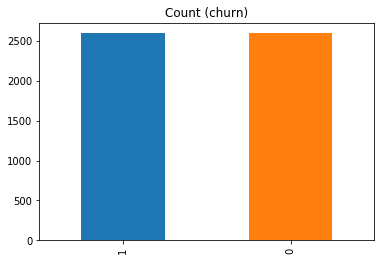

In [67]:
df_class_0_over = df_class_0.sample(count_class_1, replace=True, random_state =100)
telecom_high_value_df_treated_3 = pd.concat([df_class_1, df_class_0_over], axis=0)

print('Random under-sampling:')
print(telecom_high_value_df_treated_3.churn.value_counts())

telecom_high_value_df_treated_3.churn.value_counts().plot(kind='bar', title='Count (churn)');

Random over-sampling:
1    27418
0    27418
Name: churn, dtype: int64


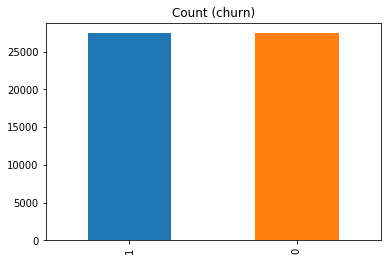

In [68]:
df_class_1_under = df_class_1.sample(count_class_0, replace=True, random_state = 100)
telecom_high_value_df_treated_4 = pd.concat([df_class_1_under, df_class_0], axis=0)

print('Random over-sampling:')
print(telecom_high_value_df_treated_4.churn.value_counts())

telecom_high_value_df_treated_4.churn.value_counts().plot(kind='bar', title='Count (churn)');

In [69]:
telecom_high_value_df_treated_3.shape

(5186, 107)

In [70]:
telecom_high_value_df_treated_4.shape

(54836, 107)

Choosing the Over Sampled dataset for model building

#### The reson for choosing the over sampled version is we think that 5186 number of data points need not provide us the right kind of platform for an effective model building and hence if the data points are more we can build a more effective model.

In [71]:
from sklearn.model_selection import train_test_split

In [72]:
# Putting feature variable to X
X = telecom_high_value_df_treated_4.drop(['churn','mobile_number'],axis=1)


# Putting response variable to y
y = telecom_high_value_df_treated_4['churn']




In [73]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

In [74]:
X_train.shape

(38385, 105)

In [75]:
X_test.shape

(16451, 105)

#### We have choosen RFE with 10 variables as we have to give actionable recommendations.

In [76]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 10)             # running RFE with 15 variables as output
rfe = rfe.fit(X_train,y_train)
print(rfe.support_)           # Printing the boolean results
print(rfe.ranking_)           # Printing the ranking

[False False False  True False False False False False False False False
 False False False False False False False False False False False False
 False False False False  True False False False False False False False
 False  True False False False False False  True False False False False
 False False False False False False False  True False False False False
 False False False False False False False False False False  True False
 False False False False False  True False False False False False False
 False False False False False False  True False False False False False
 False False False False False False False  True  True]
[24  8 31  1 56 63 37 57 35 12 41 42 38 11 19 85 82 16 64 14 67 66 83 36
 96 79 10 15  1 73 55 20 39 80 88 86 87  1 50 72 54 68 89  1 49 76 33 90
 77 32 92 51  6 69 13  1 61 29 45 60 52 65 78 84 30 44 93 28  2 43  1 70
 21 71 46  7 25  1  5 27 47 34 23  9 18 74 91  4 26 48  1 53 94 17 59 22
 81 62  3 75 95 58 40  1  1]


In [77]:
col = X_train.columns[rfe.support_]

In [78]:
import statsmodels.api as sm

### This is MODEL 1

In [79]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train[col])), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                38385
Model:                            GLM   Df Residuals:                    38374
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -15531.
Date:                Sun, 18 Nov 2018   Deviance:                       31061.
Time:                        20:48:47   Pearson chi2:                 4.92e+04
No. Iterations:                     6   Covariance Type:             nonrobust
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -1.3932      0.022    -63.810      0.000      -1.436      -1.350
monthly_2g_6            -0.4253      0.047     -9.087      0.000      -0.517      -0.334
loc_og_mou_8             3.8023      0.589      6.458      0.000       2.648       4.956
std_og_mou_8             4.7160      0.659      7.159      0.000       3.425       6.007
total_og_mou_8          -6.4573      0.820     -7.872      0.000      -8.065      -4.850
loc_ic_mou_8             0.7081      0.132      5.381      0.000       0.450       0.966
total_ic_mou_8          -1.5029      0.127    -11.811      0.000      -1.752      -1.253
total_rech_amt_7         0.5050      0.016     32.115      0.000       0.474       0.536
av_rech_amt_data_8      -0.6928      0.021    -33.254      0.000      -0.734      -0.652
last_day_rch_amt_8      -0.6517      0.018    -36.774      0.000      -0.686      -0.617
count_last_rech_days     0.6925      0.015     47.258      0.000       0.664       0.721
========================================================================================
"""

### Function for computing VIF since we speculate multi-collinearity

In [80]:
# UDF for calculating vif value
def vif_cal(input_data, dependent_col):
    vif_df = pd.DataFrame( columns = ['Var', 'Vif'])
    x_vars=input_data.drop([dependent_col], axis=1)
    xvar_names=x_vars.columns
    for i in range(0,xvar_names.shape[0]):
        y=x_vars[xvar_names[i]] 
        x=x_vars[xvar_names.drop(xvar_names[i])]
        rsq=sm.OLS(y,x).fit().rsquared  
        vif=round(1/(1-rsq),2)
        vif_df.loc[i] = [xvar_names[i], vif]
    return vif_df.sort_values(by = 'Vif', axis=0, ascending=False, inplace=False)

In [81]:
telecom_high_value_df_treated_5 = telecom_high_value_df_treated_4.loc[:, telecom_high_value_df_treated_4.columns.isin(col)]

In [82]:
telecom_high_value_df_treated_5['churn'] = telecom_high_value_df_treated_4['churn']

In [83]:
vif_cal(input_data=telecom_high_value_df_treated_5, dependent_col="churn")

,Var,Vif
3,total_og_mou_8,4274.31
2,std_og_mou_8,2054.19
1,loc_og_mou_8,1716.01
4,loc_ic_mou_8,85.71
5,total_ic_mou_8,85.64
8,last_day_rch_amt_8,1.38
9,count_last_rech_days,1.31
7,av_rech_amt_data_8,1.29
6,total_rech_amt_7,1.19
0,monthly_2g_6,1.06


#### Deciding to drop total_og_mou_8 is obvious for its high VIF. However, we shall not drop more than one variable at a time since we know post dropping one variable and as we recompute the VIF for other variables, the values might chnage drastically.

In [84]:
telecom_high_value_df_treated_5 = telecom_high_value_df_treated_5.drop(['total_og_mou_8'],1)

In [85]:
vif_cal(input_data=telecom_high_value_df_treated_5, dependent_col="churn")

,Var,Vif
3,loc_ic_mou_8,85.70
4,total_ic_mou_8,85.56
1,loc_og_mou_8,3.32
2,std_og_mou_8,1.60
7,last_day_rch_amt_8,1.37
8,count_last_rech_days,1.30
6,av_rech_amt_data_8,1.28
5,total_rech_amt_7,1.19
0,monthly_2g_6,1.06


#### Dropping loc_ic_mou_8 owing to high VIF value.

In [86]:
telecom_high_value_df_treated_5 = telecom_high_value_df_treated_5.drop(['loc_ic_mou_8'],1)

In [87]:
vif_cal(input_data=telecom_high_value_df_treated_5, dependent_col="churn")

,Var,Vif
3,total_ic_mou_8,3.24
1,loc_og_mou_8,3.22
6,last_day_rch_amt_8,1.37
7,count_last_rech_days,1.30
2,std_og_mou_8,1.28
5,av_rech_amt_data_8,1.28
4,total_rech_amt_7,1.19
0,monthly_2g_6,1.05


#### Dropping total_ic to bring down VIF for the remaining even further. This is a bit subjective since a VIF value of 3.24 is not so high and we could have retained this variable

In [88]:
telecom_high_value_df_treated_5 = telecom_high_value_df_treated_5.drop(['total_ic_mou_8'],1)

In [89]:
vif_cal(input_data=telecom_high_value_df_treated_5, dependent_col="churn")

,Var,Vif
1,loc_og_mou_8,1.39
5,last_day_rch_amt_8,1.36
6,count_last_rech_days,1.30
2,std_og_mou_8,1.27
4,av_rech_amt_data_8,1.26
3,total_rech_amt_7,1.19
0,monthly_2g_6,1.05


In [90]:
X_train2 =X_train[col]

In [91]:
X_train2.shape

(38385, 10)

In [92]:
X_test2 = X_test[col]

In [93]:
X_test2.shape

(16451, 10)

In [94]:
X_train2 = X_train2.drop(['total_og_mou_8','loc_ic_mou_8','total_ic_mou_8'],1)
X_test2 = X_test2.drop(['total_og_mou_8','loc_ic_mou_8','total_ic_mou_8'],1)

In [95]:
X_train2.shape

(38385, 7)

In [96]:
X_test2.shape

(16451, 7)

In [97]:
# Importing matplotlib and seaborn
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

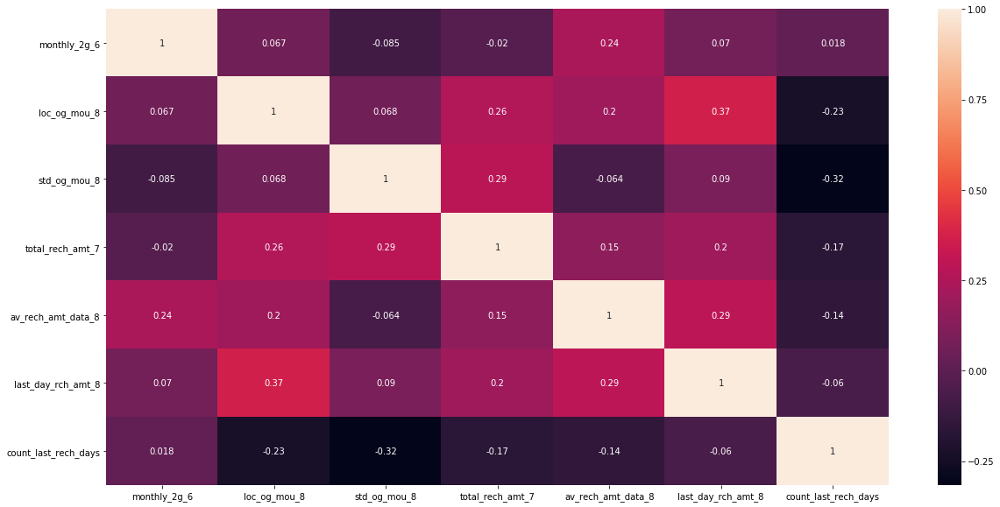

In [98]:
plt.figure(figsize = (20,10))
sns.heatmap(X_train2.corr(),annot = True)

#### The plot above shows that the ramining 7 variables are not highly correlated which is good and hence we can proceed with them.

In [99]:
# Let's run the model using the selected variables
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
logsk = LogisticRegression()
logsk.fit(X_train2, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [100]:
# Predicted probabilities
y_pred = logsk.predict_proba(X_test2)
# Converting y_pred to a dataframe which is an array
y_pred_df = pd.DataFrame(y_pred)
y_pred_df.head()

,0,1
0,0.957910,0.042090
1,0.029151,0.970849
2,0.080252,0.919748
3,0.014399,0.985601
4,0.171329,0.828671


In [101]:
y_pred_df.shape

(16451, 2)

In [102]:
# Converting to column dataframe
y_pred_1 = y_pred_df.iloc[:,[1]]
# Let's see the head
y_pred_1.head()

,1
0,0.042090
1,0.970849
2,0.919748
3,0.985601
4,0.828671


In [103]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)
y_test_df.head()

,churn
23388,0
28002,1
21646,1
13177,1
11840,1


In [104]:
#y_test_df['mobile_number'] = y_test_df.index
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df,y_pred_1],axis=1)
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 1 : 'Churn_Prob'})
# Rearranging the columns
y_pred_final = y_pred_final.reindex_axis(['churn','Churn_Prob'], axis=1)
# Let's see the head of y_pred_final
y_pred_final.head()

,churn,Churn_Prob
0,0,0.042090
1,1,0.970849
2,1,0.919748
3,1,0.985601
4,1,0.828671


In [105]:
# Creating new column 'predicted' with 1 if Churn_Prob>0.5 else 0
y_pred_final['predicted'] = y_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)
# Let's see the head
y_pred_final.head()

,churn,Churn_Prob,predicted
0,0,0.042090,0
1,1,0.970849,1
2,1,0.919748,1
3,1,0.985601,1
4,1,0.828671,1


In [106]:
from sklearn import metrics

In [107]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_pred_final.churn, y_pred_final.predicted)
confusion

array([[6795, 1447],
       [1296, 6913]], dtype=int64)

In [108]:
#Let's check the overall accuracy.
metrics.accuracy_score( y_pred_final.churn, y_pred_final.predicted)

0.8332624156586226

In [109]:
TP = confusion[0,0] # true positive 
TN = confusion[1,1] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [110]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8398220244716351

In [111]:
# Let us calculate specificity
TN / float(TN+FP)

0.8269138755980862

In [112]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/float(TN+FP))

0.17308612440191387


In [113]:
# Calculate false negative rate - predicting non-churn when customer have actually churned
print(FN/ float(TP+FN))

0.16017797552836485


In [114]:
# positive predictive value 
print (TP / float(TP+FP))

0.8244358165493813


In [115]:
# Negative predictive value
print (TN / float(TN+ FN))

0.8421244975027409


In [116]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 4))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

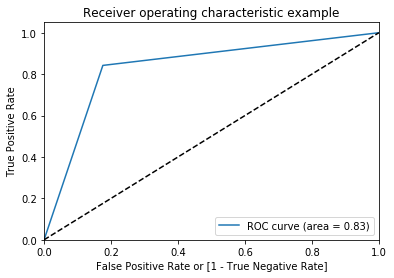

(array([0.        , 0.17556418, 1.        ]),
 array([0.       , 0.8421245, 1.       ]),
 array([2, 1, 0], dtype=int64))

In [117]:
draw_roc(y_pred_final.churn, y_pred_final.predicted)

In [118]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_pred_final[i]= y_pred_final.Churn_Prob.map( lambda x: 1 if x > i else 0)
y_pred_final.head()

,churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.042090,0,1,0,0,0,0,0,0,0,0,0
1,1,0.970849,1,1,1,1,1,1,1,1,1,1,1
2,1,0.919748,1,1,1,1,1,1,1,1,1,1,1
3,1,0.985601,1,1,1,1,1,1,1,1,1,1,1
4,1,0.828671,1,1,1,1,1,1,1,1,1,1,0


In [119]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix
num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix( y_pred_final.churn, y_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    sensi = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    speci = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.498997  0.000000  1.000000
0.1   0.1  0.664944  0.355496  0.975636
0.2   0.2  0.737402  0.524023  0.951638
0.3   0.3  0.782810  0.645960  0.920210
0.4   0.4  0.811440  0.748362  0.874772
0.5   0.5  0.833262  0.824436  0.842124
0.6   0.6  0.826394  0.875516  0.777074
0.7   0.7  0.798371  0.912521  0.683762
0.8   0.8  0.736004  0.946736  0.524424
0.9   0.9  0.639961  0.976462  0.302107


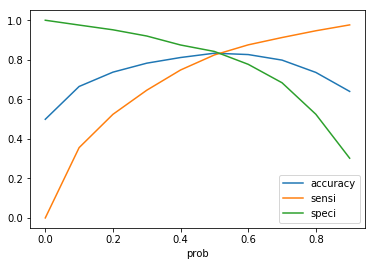

In [120]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])

### Optimum cut-off value from the graph is 0.5

In [121]:
"{:2.2f}".format(metrics.roc_auc_score(y_pred_final.churn, y_pred_final.Churn_Prob))

'0.89'

In [122]:
X_test2.columns

Index(['monthly_2g_6', 'loc_og_mou_8', 'std_og_mou_8', 'total_rech_amt_7',
       'av_rech_amt_data_8', 'last_day_rch_amt_8', 'count_last_rech_days'],
      dtype='object')

### This is the end of Part 1

### Here we go for PCA

In [123]:
telecom_high_value_df_treated_4.shape

(54836, 107)

In [124]:
Final_DF_PCA = telecom_high_value_df_treated_4.loc[:,:]

In [125]:
Final_DF_PCA.shape

(54836, 107)

In [126]:
all_cols = Final_DF_PCA.columns

In [127]:
X = Final_DF_PCA[all_cols.drop('churn')]

In [128]:
y = Final_DF_PCA['churn']

In [129]:
#random_state is the seed used by the random number generator, it can be any integer.
from sklearn.model_selection import train_test_split
X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X, y, train_size=0.7 ,test_size = 0.3, random_state=100)

In [130]:
X_train_pca.shape

(38385, 106)

In [131]:
X_test_pca.shape

(16451, 106)

In [132]:
#Improting the PCA module
from sklearn.decomposition import PCA
#pca = PCA(svd_solver='randomized', random_state=42)
pca = PCA()

In [133]:
#Doing the PCA on the train data
pca.fit(X_train_pca)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [134]:
pca.components_

array([[ 1.00000000e+00,  1.58414742e-08,  2.77706168e-09, ...,
         1.02121555e-07,  7.89395479e-08, -4.02459373e-08],
       [-7.28649095e-07,  2.96563146e-02,  3.89265310e-02, ...,
         8.11938511e-02,  1.03195320e-01, -5.14981364e-02],
       [ 1.42218878e-07, -4.70539864e-02, -3.78498149e-02, ...,
        -6.91816781e-03, -9.97584907e-03, -8.68894367e-02],
       ...,
       [-0.00000000e+00, -1.50053581e-16,  3.21334952e-16, ...,
        -8.41340886e-17, -2.60208521e-17,  1.99493200e-17],
       [ 0.00000000e+00, -2.42861287e-17, -2.56812919e-16, ...,
        -1.12757026e-16,  1.38777878e-17, -6.93889390e-18],
       [ 0.00000000e+00, -3.32650574e-13, -1.42973665e-12, ...,
         6.02747019e-14,  4.12531120e-13,  2.27643598e-12]])

In [135]:
pca.explained_variance_ratio_

array([1.00000000e+00, 3.42102436e-11, 2.41745881e-11, 1.62851658e-11,
       1.11448576e-11, 8.71397868e-12, 8.32033328e-12, 7.56820815e-12,
       5.75673229e-12, 4.00646935e-12, 3.78846579e-12, 3.39680869e-12,
       3.09122518e-12, 2.98969146e-12, 2.82727025e-12, 2.33481340e-12,
       2.22507669e-12, 2.07727779e-12, 1.97019960e-12, 1.90151736e-12,
       1.83116963e-12, 1.70305652e-12, 1.66213560e-12, 1.59960800e-12,
       1.48398709e-12, 1.38610420e-12, 1.35927864e-12, 1.31699656e-12,
       1.30072667e-12, 1.20111156e-12, 1.15171641e-12, 1.07929776e-12,
       1.06667288e-12, 1.05036610e-12, 1.01279648e-12, 9.51589077e-13,
       9.27122348e-13, 9.12320425e-13, 9.00222050e-13, 8.71697981e-13,
       7.76104789e-13, 7.68638823e-13, 7.50138753e-13, 6.94112369e-13,
       6.48787273e-13, 6.43984896e-13, 6.13228548e-13, 5.78136972e-13,
       5.57047292e-13, 5.18271129e-13, 5.03108774e-13, 4.80916204e-13,
       4.66233749e-13, 4.53031340e-13, 4.41588065e-13, 4.17684688e-13,
      

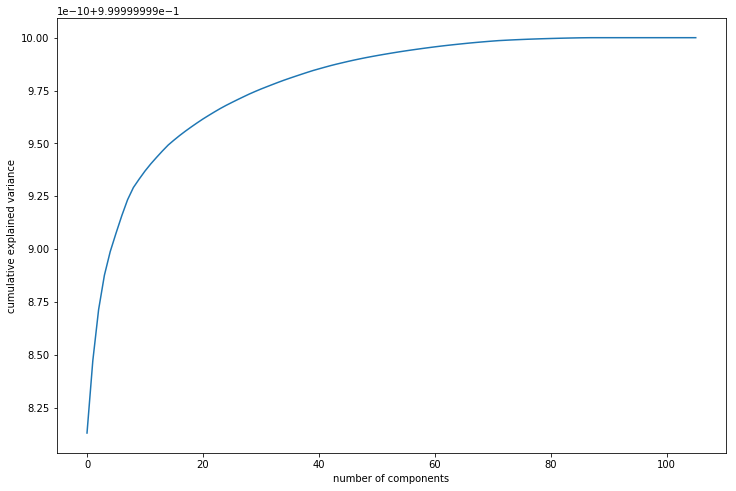

In [136]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [137]:
#Using incremental PCA for efficiency
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=18)

In [138]:
df_train_pca = pca_final.fit_transform(X_train_pca)
df_train_pca.shape

(38385, 18)

In [139]:
#creating correlation matrix for the principal components
corrmat = np.corrcoef(df_train_pca.transpose())

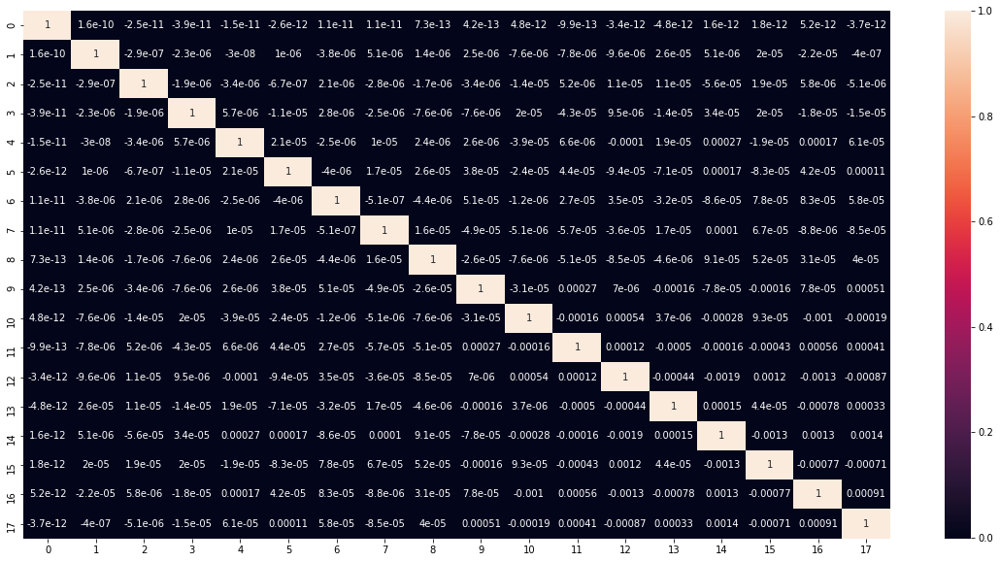

In [140]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (20,10))
sns.heatmap(corrmat,annot = True)

In [141]:
# putting Diagonal elements to 0
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)
#We are getting very little to 0 Correlaations

max corr: 0.001415164566313203 , min corr:  -0.0018560900238618631


In [142]:
#Applying selected components to the test data - 16 components
df_test_pca = pca_final.transform(X_test_pca)
df_test_pca.shape

(16451, 18)

### Applying Logistic Regression to Principal Components

In [143]:
#Training the model on the train data
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

learner_pca = LogisticRegression()
model_pca = learner_pca.fit(df_train_pca,y_train_pca)

In [144]:
#Making prediction on the test data
pred_probs_test = model_pca.predict_proba(df_test_pca)[:,1]
"{:2.2}".format(metrics.roc_auc_score(y_test_pca, pred_probs_test))

'0.54'

In [145]:
pred_pca_test1 = model_pca.predict(df_test_pca)
print(metrics.accuracy_score(y_test_pca, pred_pca_test1))

0.5377180718497355


###  Repeat PCA

In [147]:
pca_again = PCA(0.95)

In [148]:
df_train_pca2 = pca_again.fit_transform(X_train_pca)
df_train_pca2.shape


(38385, 1)

In [149]:
#training the regression model
learner_pca2 = LogisticRegression()
model_pca2 = learner_pca2.fit(df_train_pca2,y_train_pca)

In [150]:
df_test_pca2 = pca_again.transform(X_test_pca)
df_test_pca2.shape

(16451, 1)

In [151]:
#Making prediction on the test data
pred_probs_test2 = model_pca2.predict_proba(df_test_pca2)[:,1]
"{:2.2f}".format(metrics.roc_auc_score(y_test, pred_probs_test2))

'0.54'

### Changing the number of Components

In [152]:
components = [1,3,5,8,9,12,15,20]

In [153]:

for i in components:
    print("No of Components: ",i)
    pca_last = PCA(n_components=i)
    df_train_pca3 = pca_last.fit_transform(X_train)
    df_test_pca3 = pca_last.transform(X_test)
    print("Shape of the DF: ", df_test_pca3.shape)
    
    #training the regression model
    learner_pca3 = LogisticRegression()
    model_pca3 = learner_pca3.fit(df_train_pca3,y_train)
    #Making prediction on the test data
    
    pred_probs_test3 = model_pca3.predict_proba(df_test_pca3)[:,1]
    print("Model ROC_Accurecy Score: ", "{:2.2f}".format(metrics.roc_auc_score(y_test, pred_probs_test3)))
    
    y_predicted_PCA = model_pca3.predict(df_test_pca3)
    
    print("Model Accuracy score: ", metrics.accuracy_score(y_test,y_predicted_PCA))
    confusion_PCA = metrics.confusion_matrix( y_test, y_predicted_PCA)
    
    TN = confusion_PCA[0,0] # true negatives 
    TP = confusion_PCA[1,1] # true positive
    FP = confusion_PCA[0,1] # false positives
    FN = confusion_PCA[1,0] # false negatives 
    
    #Printing only Sensitivity as we are more interested in Churn prediction
    print('sensitivity '+str(TP / float(TP+FN)))
    print('specificity '+str(TN / float(TN+FP)))
    
    print("*****************")
    

No of Components:  1
Shape of the DF:  (16451, 1)
Model ROC_Accurecy Score:  0.80
Model Accuracy score:  0.7285879277855449
sensitivity 0.7814593738579608
specificity 0.6759281727735986
*****************
No of Components:  3
Shape of the DF:  (16451, 3)
Model ROC_Accurecy Score:  0.82
Model Accuracy score:  0.7315056835450733
sensitivity 0.7567304178340846
specificity 0.7063819461295802
*****************
No of Components:  5
Shape of the DF:  (16451, 5)
Model ROC_Accurecy Score:  0.85
Model Accuracy score:  0.773387636009969
sensitivity 0.7647703739797783
specificity 0.7819703955350643
*****************
No of Components:  8
Shape of the DF:  (16451, 8)
Model ROC_Accurecy Score:  0.89
Model Accuracy score:  0.8193422892225397
sensitivity 0.805335607260324
specificity 0.8332928900752244
*****************
No of Components:  9
Shape of the DF:  (16451, 9)
Model ROC_Accurecy Score:  0.89
Model Accuracy score:  0.8215306060421859
sensitivity 0.8095992203678889
specificity 0.8334142198495511


After running Logistic Regression with PCA on various components, we choose 8 components.
Building the model with 8 components.

In [154]:
pca_final = PCA(n_components=8)
df_train_pca_final = pca_final.fit_transform(X_train)
df_test_pca_final = pca_final.transform(X_test)
print("Shape of the DF: ", df_test_pca_final.shape)

#training the regression model
learner_pca_final = LogisticRegression()
model_pca_final = learner_pca_final.fit(df_train_pca_final,y_train)
#Making prediction on the test data

pred_probs_test_final = model_pca_final.predict_proba(df_test_pca_final)[:,1]
print("Final LogReg Model with PCA, Accurecy Score: ", "{:2.2f}".format(metrics.roc_auc_score(y_test, pred_probs_test_final)))

Shape of the DF:  (16451, 8)
Final LogReg Model with PCA, Accurecy Score:  0.89


In [155]:
y_predicted_PCA_final = model_pca_final.predict(df_test_pca_final)

In [156]:
confusion_PCA = metrics.confusion_matrix( y_test, y_predicted_PCA_final)
confusion_PCA

array([[6867, 1375],
       [1598, 6611]], dtype=int64)

In [157]:
metrics.accuracy_score(y_test,y_predicted_PCA_final)

0.8192815026442162

In [158]:
TN = confusion_PCA[0,0] # true negatives 
TP = confusion_PCA[1,1] # true positive
FP = confusion_PCA[0,1] # false positives
FN = confusion_PCA[1,0] # false negatives 

print('sensitivity '+str(TP / float(TP+FN)))
print('specificity '+str(TN / float(TN+FP)))

sensitivity 0.805335607260324
specificity 0.8331715603008979


In [159]:
#importing few packages
from sklearn import metrics
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import scale

## Random Forest with PCA

In [160]:
# Choose 18 components as it represents 95% variance from the Scree plot
pca_rf = PCA(n_components=18)

df_train_pca_rf = pca_rf.fit_transform(X_train_pca)
df_test_pca_rf = pca_rf.transform(X_test_pca)

print("Shape of the DF: ", df_test_pca_rf.shape)

Shape of the DF:  (16451, 18)


In [161]:

from sklearn.ensemble import RandomForestClassifier

# Running the random forest with default parameters.
learner_pca_rf = RandomForestClassifier()
model_pca_rf = learner_pca_rf.fit(df_train_pca_rf,y_train)

In [162]:
#Making prediction on the test data

pred_pca_test_rf = model_pca_rf.predict_proba(df_test_pca_rf)[:,1]

print("Random Forest Model with PCA, ROC_Accurecy Score: ", "{:2.2f}".format(metrics.roc_auc_score(y_test, pred_pca_test_rf)))

y_predicted_PCA_rf = model_pca_rf.predict(df_test_pca_rf)
confusion_PCA_rf = metrics.confusion_matrix( y_test, y_predicted_PCA_rf)
print(confusion_PCA_rf)
print("Random Forest Model with PCA, Accuracy score: ",metrics.accuracy_score(y_test,y_predicted_PCA_rf))

Random Forest Model with PCA, ROC_Accurecy Score:  1.00
[[7968  274]
 [  27 8182]]
Random Forest Model with PCA, Accuracy score:  0.9817032399246246


In [163]:
      
TN = confusion_PCA_rf[0,0] # true negatives 
TP = confusion_PCA_rf[1,1] # true positive
FP = confusion_PCA_rf[0,1] # false positives
FN = confusion_PCA_rf[1,0] # false negatives 

print('sensitivity '+str(TP / float(TP+FN)))
print('specificity '+str(TN / float(TN+FP)))

sensitivity 0.9967109270313071
specificity 0.9667556418345062


#### RFC Hyperparameter Tuning

##### Proceeding with Hyperparameter Tuning as the default model leads to Overfitting

##### Tuning max_depth

In [223]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 5)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")

rf.fit(df_train_pca_rf,y_train)

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': range(2, 20, 5)}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='accuracy',
       verbose=0)

In [224]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_max_depth,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,0.285570,0.007958,0.785906,0.787658,2,{'max_depth': 2},4,0.786012,0.795356,0.789762,0.779276,0.772437,0.780969,0.782988,0.780513,0.798332,0.802175,0.023704,0.000156,0.008476,0.009339
1,0.747034,0.014120,0.849733,0.858135,7,{'max_depth': 7},3,0.850612,0.862018,0.847336,0.855412,0.854240,0.859711,0.853849,0.857985,0.842626,0.855547,0.043392,0.003203,0.004342,0.002518
2,1.233299,0.015320,0.935678,0.955530,12,{'max_depth': 12},2,0.939698,0.959846,0.943989,0.956949,0.925883,0.952521,0.936303,0.953074,0.932517,0.955257,0.363836,0.000869,0.006190,0.002676
3,1.422625,0.020084,0.968634,0.986850,17,{'max_depth': 17},1,0.967439,0.987625,0.970301,0.985444,0.965221,0.987137,0.969389,0.986811,0.970818,0.987235,0.108276,0.003826,0.002059,0.000750


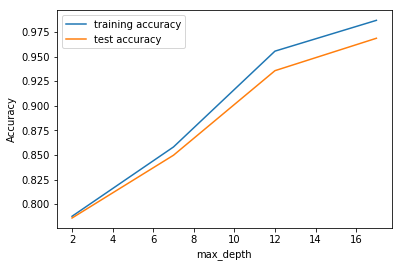

In [225]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()



##### Tuning n_estimators

In [226]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
# We have specified an appropriately low value of max_depth, so that the trees do not overfit
parameters = {'n_estimators': range(100, 1500, 400)}

# instantiate the model
rf = RandomForestClassifier(max_depth=4)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(df_train_pca_rf,y_train)

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=4, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'n_estimators': range(100, 1500, 400)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [227]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()


,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_n_estimators,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,4.531873,0.070586,0.823551,0.828025,100,{'n_estimators': 100},4,0.819875,0.831048,0.832096,0.827472,0.821936,0.824769,0.823629,0.828514,0.820219,0.828324,0.169506,0.003409,0.004478,0.002019
1,24.832276,0.380494,0.824437,0.827602,500,{'n_estimators': 500},2,0.820266,0.828443,0.829881,0.825876,0.826625,0.827765,0.823108,0.827211,0.822303,0.828715,1.215001,0.069243,0.003410,0.001010
2,47.599411,0.647316,0.824801,0.827621,900,{'n_estimators': 900},1,0.819875,0.828345,0.829751,0.825257,0.826364,0.827993,0.825974,0.829621,0.822043,0.826891,2.725945,0.017709,0.003470,0.001469
3,63.919532,0.970902,0.824358,0.827823,1300,{'n_estimators': 1300},3,0.820787,0.828866,0.829360,0.825485,0.826495,0.827797,0.822587,0.827862,0.822564,0.829105,2.358324,0.065947,0.003121,0.001281


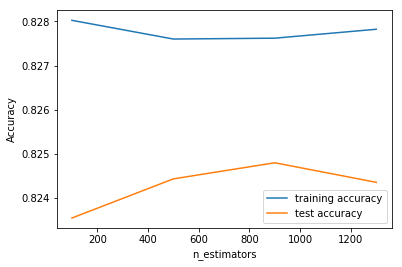

In [228]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

##### Tuning max_features

In [229]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [1, 7]}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(df_train_pca_rf,y_train)

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_features': [1, 7]}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='accuracy',
       verbose=0)

In [230]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_max_features,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,0.476197,0.023486,0.982936,0.999629,1,{'max_features': 1},1,0.980594,0.999642,0.985671,0.999414,0.982415,0.999772,0.983587,0.999772,0.982413,0.999544,0.024261,0.002442,0.001670,0.000138
1,2.232068,0.020814,0.977648,0.999166,7,{'max_features': 7},2,0.977598,0.999414,0.979289,0.999251,0.975642,0.999056,0.979028,0.998925,0.976681,0.999186,0.086707,0.003955,0.001383,0.000167


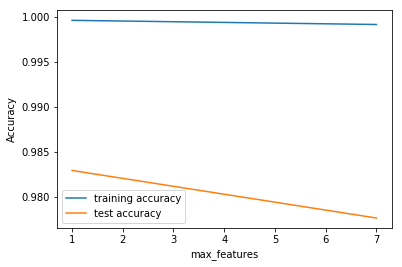

In [231]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

##### Tuning min_samples_leaf

In [232]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(df_train_pca_rf,y_train)

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'min_samples_leaf': range(100, 400, 50)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [233]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_min_samples_leaf,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,0.820481,0.013341,0.847961,0.855484,100,{'min_samples_leaf': 100},1,0.845012,0.859413,0.852416,0.853556,0.848378,0.854761,0.850723,0.853524,0.843278,0.856166,0.014855,0.001127,0.003414,0.002190
1,0.770722,0.012063,0.838479,0.843826,150,{'min_samples_leaf': 150},2,0.831857,0.843228,0.843949,0.843494,0.847206,0.846978,0.835483,0.839911,0.833898,0.845518,0.019975,0.000138,0.005998,0.002391
2,0.764590,0.011739,0.833268,0.838283,200,{'min_samples_leaf': 200},3,0.830164,0.841339,0.836525,0.834473,0.836525,0.840595,0.833268,0.837436,0.829859,0.837572,0.029689,0.000296,0.002914,0.002467
3,0.728062,0.011233,0.829126,0.833659,250,{'min_samples_leaf': 250},4,0.823912,0.835347,0.834701,0.829263,0.833138,0.832975,0.829751,0.836134,0.824127,0.834576,0.045072,0.000109,0.004466,0.002434
4,0.666111,0.010938,0.828501,0.832096,300,{'min_samples_leaf': 300},5,0.824694,0.832644,0.835873,0.831151,0.829621,0.829881,0.827407,0.833659,0.824909,0.833143,0.009568,0.000155,0.004104,0.001388


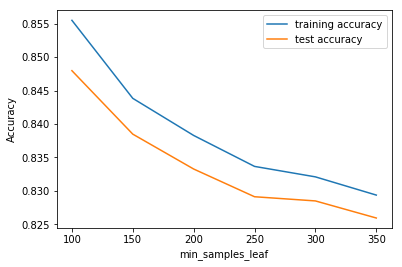

In [234]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

##### Tuning min_samples_split

In [235]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(df_train_pca_rf,y_train)

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'min_samples_split': range(200, 500, 50)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [236]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_min_samples_split,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,1.146811,0.015550,0.872190,0.887840,200,{'min_samples_split': 200},1,0.867804,0.884880,0.877947,0.888694,0.874691,0.887326,0.871955,0.888270,0.868551,0.890032,0.084920,0.000226,0.003793,0.001717
1,1.101808,0.014988,0.864478,0.876833,250,{'min_samples_split': 250},2,0.863376,0.879865,0.867787,0.873877,0.864791,0.876710,0.861144,0.873811,0.865294,0.879905,0.036598,0.000183,0.002193,0.002702
2,1.051168,0.014564,0.858460,0.868705,300,{'min_samples_split': 300},3,0.853998,0.866968,0.861534,0.865410,0.862316,0.869708,0.862316,0.874039,0.852137,0.867400,0.030859,0.000189,0.004451,0.003001
3,1.117025,0.015647,0.852885,0.862707,350,{'min_samples_split': 350},4,0.851394,0.863875,0.859060,0.862349,0.853589,0.865051,0.854110,0.861306,0.846274,0.860953,0.144340,0.001825,0.004148,0.001551
4,1.059861,0.015193,0.845721,0.856357,400,{'min_samples_split': 400},5,0.839151,0.856059,0.858278,0.861632,0.848509,0.855119,0.843428,0.853165,0.839239,0.855808,0.093010,0.002252,0.007154,0.002826


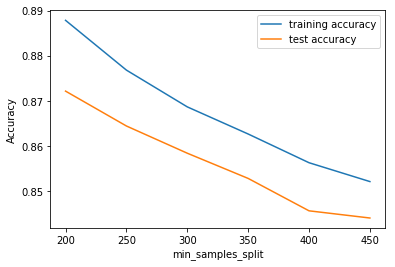

In [237]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

##### Grid Search to Find Optimal Hyperparameters for RFC with PCA

In [238]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [4,10,15],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [500,700, 900], 
    'max_features': [1,5]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 5, n_jobs = -1,verbose = 1)

In [239]:
# Fit the grid search to the data
grid_search.fit(df_train_pca_rf,y_train)

Fitting 5 folds for each of 72 candidates, totalling 360 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 42.7min
[Parallel(n_jobs=-1)]: Done 360 out of 360 | elapsed: 101.0min finished


GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [4, 10, 15], 'min_samples_leaf': range(100, 400, 200), 'min_samples_split': range(200, 500, 200), 'n_estimators': [500, 700, 900], 'max_features': [1, 5]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [240]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'with RFC using',grid_search.best_params_)

We can get accuracy of 0.8512700273544354 with RFC using {'max_depth': 15, 'max_features': 5, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 700}


#### Fitting the final model with the best parameters obtained from grid search

In [164]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=15,
                             min_samples_leaf=100, 
                             min_samples_split=200,
                             n_estimators=700,
                             max_features=5)


In [165]:
# fit
rfc.fit(df_train_pca_rf,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=15, max_features=5, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=100, min_samples_split=200,
            min_weight_fraction_leaf=0.0, n_estimators=700, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [166]:
# predict
final_predictions_rfc = rfc.predict(df_test_pca_rf)

In [167]:
confusion = metrics.confusion_matrix(y_test,final_predictions_rfc)

print(confusion)

TN = confusion[0,0] # true negatives 
TP = confusion[1,1] # true positive
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives 

print('model sensitivity '+str(TP / float(TP+FN)))
print('model specificity '+str(TN / float(TN+FP)))


print('Accuracy of the Final model with PCA+RF after Hyperparameter Tuning: ',metrics.accuracy_score(y_test,final_predictions_rfc))

[[7243  999]
 [1302 6907]]
model sensitivity 0.8413935923985869
model specificity 0.8787915554477068
Accuracy of the Final model with PCA+RF after Hyperparameter Tuning:  0.8601300832776123


# Random Forest with features from RFE & VIF

In [168]:
#using the train and test data derived after RFE & VIF

X_train_rfc = X_train2
X_test_rfc = X_test2
y_train_rfc = y_train
y_test_rfc = y_test

In [169]:
X_train_rfc.shape

(38385, 7)

In [170]:
X_test_rfc.shape

(16451, 7)

#### RFC with Default Hyperparameter

In [171]:
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier

# Running the random forest with default parameters.
rfc = RandomForestClassifier()

In [172]:
# fit
rfc.fit(X_train_rfc, y_train_rfc)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [173]:
# Making predictions
predictions_rfc = rfc.predict(X_test_rfc)

In [174]:
# Checking the report of the default RFC model
print(classification_report(y_test_rfc,predictions_rfc))

             precision    recall  f1-score   support

          0       1.00      0.96      0.98      8242
          1       0.96      1.00      0.98      8209

avg / total       0.98      0.98      0.98     16451



In [175]:
# Printing confusion matrix
print(confusion_matrix(y_test_rfc,predictions_rfc))

[[7920  322]
 [  10 8199]]


In [176]:
print(accuracy_score(y_test_rfc,predictions_rfc))

0.9798188559965959


##### After checking the RFC Accuracy with default Hyperparameters we can se that the model might cause the Overfit. Let's proceed with the Hyperparameter Tuning for RFC

#### RFC Hyperparameter Tuning

#### Tuning max_depth

In [340]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 5)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")

rf.fit(X_train_rfc, y_train_rfc)

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': range(2, 20, 5)}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='accuracy',
       verbose=0)

In [341]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.062486,0.000024,0.006248,0.007653,2,{'max_depth': 2},0.794087,0.818679,0.806044,0.802267,0.800677,0.804351,0.008141,4,0.797082,0.809724,0.804969,0.806858,0.803380,0.804403,0.004226
1,0.121846,0.006251,0.006244,0.007648,7,{'max_depth': 7},0.864939,0.872216,0.865833,0.865051,0.860995,0.865807,0.003621,3,0.873189,0.868894,0.872672,0.868764,0.873327,0.871369,0.002086
2,0.174953,0.006265,0.009367,0.007648,12,{'max_depth': 12},0.935400,0.933438,0.925492,0.931484,0.928739,0.930911,0.003491,2,0.945257,0.944477,0.941807,0.946268,0.947149,0.944992,0.001831
3,0.193700,0.007658,0.012497,0.006249,17,{'max_depth': 17},0.966137,0.964830,0.961834,0.966002,0.965086,0.964778,0.001556,1,0.984173,0.983066,0.983229,0.983620,0.983555,0.983529,0.000381


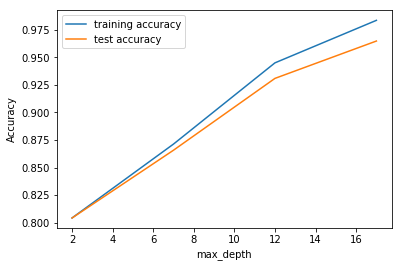

In [342]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


#### Tuning n_estimators

In [343]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
# We have specified an appropriately low value of max_depth, so that the trees do not overfit
parameters = {'n_estimators': range(100, 1500, 400)}

# instantiate the model
rf = RandomForestClassifier(max_depth=4)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(X_train_rfc, y_train_rfc)

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=4, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'n_estimators': range(100, 1500, 400)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [344]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.827930,0.019780,0.049981,0.006265,100,{'n_estimators': 100},0.828080,0.843559,0.839781,0.836525,0.830902,0.835769,0.005660,3,0.834598,0.836427,0.839456,0.838674,0.836497,0.837130,0.001738
1,4.332346,0.109419,0.228079,0.007652,500,{'n_estimators': 500},0.830815,0.841605,0.836525,0.832487,0.831423,0.834571,0.004041,4,0.837301,0.834668,0.837534,0.835808,0.838679,0.836798,0.001403
2,7.677085,0.254757,0.399890,0.007665,900,{'n_estimators': 900},0.833811,0.843298,0.837436,0.834441,0.831683,0.836134,0.004027,1,0.839027,0.835385,0.839097,0.835873,0.837181,0.837313,0.001545
3,10.875104,0.217968,0.590480,0.015301,1300,{'n_estimators': 1300},0.831987,0.843298,0.839781,0.833268,0.831553,0.835978,0.004710,2,0.838441,0.835417,0.840921,0.835678,0.838451,0.837782,0.002037


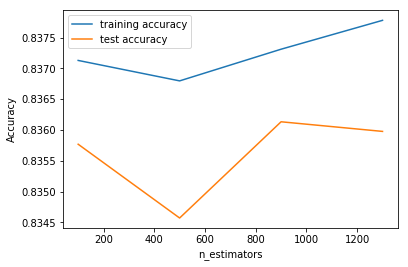

In [345]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### Tuning max_features

In [346]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [1, 7]}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(X_train_rfc, y_train_rfc)


GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_features': [1, 7]}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='accuracy',
       verbose=0)

In [347]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.159346,0.006261,0.012497,0.006249,1,{'max_features': 1},0.975905,0.976944,0.971473,0.975772,0.975248,0.975068,0.001880,1,0.996125,0.995962,0.996288,0.996092,0.995669,0.996027,0.000207
1,0.559253,0.047792,0.009378,0.007657,7,{'max_features': 7},0.973040,0.970301,0.967435,0.972776,0.969646,0.970640,0.002083,2,0.995962,0.995571,0.995473,0.995962,0.995636,0.995721,0.000203


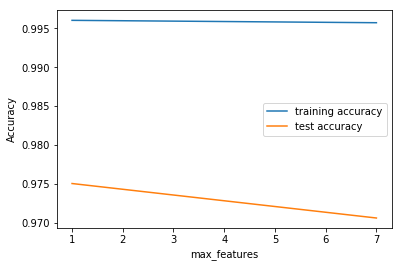

In [348]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### Tuning min_samples_leaf

In [349]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(X_train_rfc, y_train_rfc)

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'min_samples_leaf': range(100, 400, 50)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [350]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.134329,0.007666,0.012498,0.006249,100,{'min_samples_leaf': 100},0.859208,0.866875,0.852677,0.860753,0.857348,0.859372,0.004629,1,0.866382,0.862902,0.860004,0.866387,0.865837,0.864302,0.002509
1,0.128080,0.006242,0.009384,0.007662,150,{'min_samples_leaf': 150},0.857254,0.858408,0.844601,0.852026,0.852006,0.852859,0.004894,2,0.860879,0.855933,0.850658,0.858311,0.858576,0.856871,0.003479
2,0.128089,0.006239,0.000000,0.000000,200,{'min_samples_leaf': 200},0.848268,0.856975,0.849811,0.841214,0.851746,0.849603,0.005121,3,0.851858,0.851439,0.853524,0.844112,0.852682,0.850723,0.003382
3,0.124959,0.000016,0.006243,0.007646,250,{'min_samples_leaf': 250},0.847617,0.852807,0.848899,0.846424,0.841324,0.847414,0.003726,4,0.852281,0.846131,0.853068,0.849551,0.849523,0.850111,0.002447
4,0.118717,0.012495,0.006248,0.007653,300,{'min_samples_leaf': 300},0.839932,0.857366,0.844731,0.841865,0.839500,0.844679,0.006607,5,0.845117,0.847499,0.847532,0.848215,0.845094,0.846691,0.001320


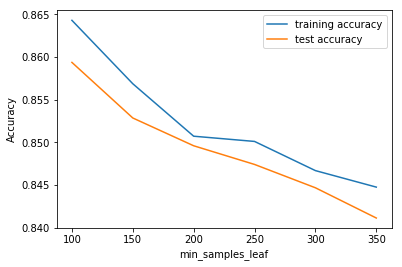

In [351]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### Tuning min_samples_split

In [352]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(X_train_rfc, y_train_rfc)

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'min_samples_split': range(200, 500, 50)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [353]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.190580,0.011690,0.003124,0.006248,200,{'min_samples_split': 200},0.868195,0.883288,0.870522,0.872997,0.864643,0.871929,0.006311,1,0.878204,0.878924,0.877003,0.880031,0.878179,0.878468,0.000995
1,0.178085,0.021189,0.012502,0.006251,250,{'min_samples_split': 250},0.864288,0.877556,0.867136,0.866615,0.867639,0.868647,0.004600,2,0.872570,0.874919,0.873811,0.872248,0.878733,0.874456,0.002339
2,0.178083,0.007653,0.003124,0.006248,300,{'min_samples_split': 300},0.860511,0.873909,0.862186,0.862446,0.864513,0.864713,0.004771,3,0.868532,0.869969,0.868471,0.870294,0.871471,0.869747,0.001134
3,0.187456,0.009879,0.012497,0.006249,350,{'min_samples_split': 350},0.862985,0.869741,0.863879,0.863488,0.855784,0.863176,0.004435,4,0.868304,0.865833,0.869578,0.868406,0.870396,0.868503,0.001544
4,0.168710,0.011691,0.009372,0.007653,400,{'min_samples_split': 400},0.861422,0.863488,0.856975,0.855933,0.856826,0.858929,0.002974,6,0.866740,0.864107,0.863098,0.860330,0.867205,0.864296,0.002516


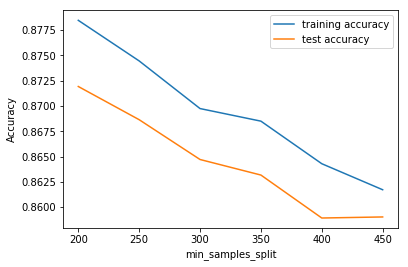

In [354]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

<hr>

### Grid Search to Find Optimal Hyperparameters for RFC

In [177]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [4,10,15],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200, 300]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 5, n_jobs = -1,verbose = 1)

In [162]:
# Fit the grid search to the data
grid_search.fit(X_train_rfc, y_train_rfc)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   55.7s
[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed:  3.5min finished


GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [4, 10, 15], 'min_samples_leaf': range(100, 400, 200), 'min_samples_split': range(200, 500, 200), 'n_estimators': [100, 200, 300]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [163]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'with RFC using',grid_search.best_params_)

We can get accuracy of 0.8634101862706787 with RFC using {'max_depth': 15, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 300}


### Fitting the final model with the best parameters obtained from grid search

In [178]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=15,
                             min_samples_leaf=100, 
                             min_samples_split=200,
                             n_estimators=200)

In [179]:
# fit
rfc.fit(X_train_rfc, y_train_rfc)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=15, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=100, min_samples_split=200,
            min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [180]:
# predict
final_predictions_rfc = rfc.predict(X_test_rfc)

In [181]:
print(classification_report(y_test_rfc,final_predictions_rfc))

             precision    recall  f1-score   support

          0       0.85      0.89      0.87      8242
          1       0.88      0.85      0.87      8209

avg / total       0.87      0.87      0.87     16451



In [183]:
confusion = confusion_matrix(y_test_rfc,final_predictions_rfc)
confusion

array([[7315,  927],
       [1246, 6963]], dtype=int64)

In [184]:
TN = confusion[0,0] # true negatives 
TP = confusion[1,1] # true positive
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives 

print('model sensitivity '+str(TP / float(TP+FN)))
print('model specificity '+str(TN / float(TN+FP)))

model sensitivity 0.8482153733706908
model specificity 0.8875272991992235


In [185]:
print(accuracy_score(y_test_rfc,final_predictions_rfc))

0.8679107653030211


#  Decision Tree

Retaining only the columns selected after RFE and VIF exercise

In [250]:
df_prior_normalization = df_prior_normalization[['loc_og_mou_8','last_day_rch_amt_8','count_last_rech_days','std_og_mou_8','av_rech_amt_data_8','total_rech_amt_7','monthly_2g_6','churn']]

In [274]:
df_prior_normalization.head()

,loc_og_mou_8,last_day_rch_amt_8,count_last_rech_days,std_og_mou_8,av_rech_amt_data_8,total_rech_amt_7,monthly_2g_6,churn
7,214.260,325.0,5,61.15,0.0,790.0,0,1
8,63.155,10.0,1,98.27,69.0,601.0,0,0
13,342.295,0.0,1,488.99,69.0,253.0,0,0
16,205.920,130.0,13,21.52,0.0,348.0,0,0
17,0.000,0.0,6,0.00,0.0,0.0,0,0


Handling the Class Imbalance Issue with Under/Over Sampling the Dataset

In [275]:
count_class0, count_class1 = df_prior_normalization.churn.value_counts()
# Divide by class
df_class0 = df_prior_normalization[df_prior_normalization['churn'] == 0]
df_class1 = df_prior_normalization[df_prior_normalization['churn'] == 1]

Random under-sampling:
1    2593
0    2593
Name: churn, dtype: int64


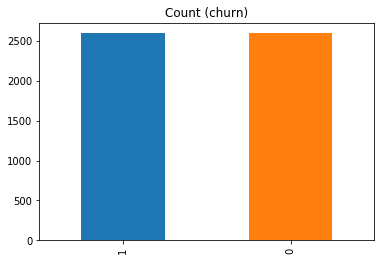

In [276]:
df_class0_under = df_class0.sample(count_class1, replace=True, random_state =100)
df_prior_normalization_balanced = pd.concat([df_class1, df_class0_under], axis=0)

print('Random under-sampling:')
print(df_prior_normalization_balanced.churn.value_counts())

df_prior_normalization_balanced.churn.value_counts().plot(kind='bar', title='Count (churn)');

In [253]:
df_prior_normalization_balanced.shape

(5186, 8)

Random over-sampling:
1    27418
0    27418
Name: churn, dtype: int64


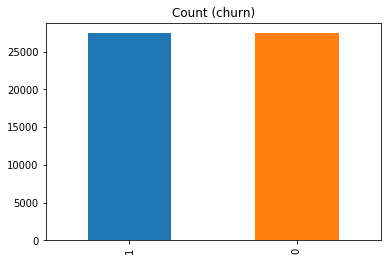

In [278]:
df_class1_over = df_class1.sample(count_class0, replace=True, random_state = 100)
df_prior_normalization_balanced = pd.concat([df_class1_over, df_class0], axis=0)

print('Random over-sampling:')
print(df_prior_normalization_balanced.churn.value_counts())

df_prior_normalization_balanced.churn.value_counts().plot(kind='bar', title='Count (churn)');

In [280]:
df_prior_normalization_balanced.shape

(54836, 8)

In [282]:
# Putting feature variable to X
X = df_prior_normalization_balanced.drop('churn',axis=1)

# Putting response variable to y
y = df_prior_normalization_balanced['churn']

In [283]:
# Splitting the data into train and test
X_train_dt, X_test_dt, y_train_dt, y_test_dt = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

In [284]:
X_train_dt.shape

(38385, 7)

In [285]:
X_test_dt.shape

(16451, 7)

In [287]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 7 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(max_depth=7)
dt_default.fit(X_train_dt, y_train_dt)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=7,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [288]:
# Making predictions
y_pred_default_dt = dt_default.predict(X_test_dt)

# Printing classification report
print(classification_report(y_test_dt, y_pred_default_dt))

             precision    recall  f1-score   support

          0       0.85      0.87      0.86      8242
          1       0.87      0.85      0.86      8209

avg / total       0.86      0.86      0.86     16451



In [289]:
# Printing confusion matrix and accuracy
print(confusion_matrix(y_test_dt, y_pred_default_dt))
print(accuracy_score(y_test_dt, y_pred_default_dt))

[[7199 1043]
 [1264 6945]]
0.8597653638076712


### Plotting the Tree

In [293]:
# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

# Putting features
features = list(df_prior_normalization_balanced.columns[:-1])

In [294]:
features

['loc_og_mou_8',
 'last_day_rch_amt_8',
 'count_last_rech_days',
 'std_og_mou_8',
 'av_rech_amt_data_8',
 'total_rech_amt_7',
 'monthly_2g_6']

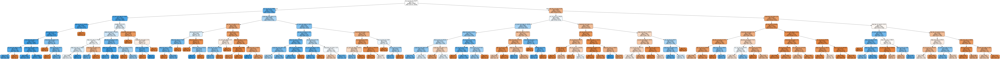

In [295]:
# plotting tree with max_depth=3
dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,
                filled=True,rounded=True,
                special_characters=True,
               feature_names=features)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Hyperparameter Tuning for DT

#### Tuning max_depth

In [388]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(1, 40)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
tree.fit(X_train_dt, y_train_dt)

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': range(1, 40)}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='accuracy',
       verbose=0)

In [389]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.015628,0.000021,0.0,0.0,1,{'max_depth': 1},0.768169,0.778950,0.773609,0.766445,0.769802,0.771395,0.004459,39,0.772202,0.769506,0.770841,0.772633,0.771793,0.771395,0.001115
1,0.021874,0.007636,0.0,0.0,2,{'max_depth': 2},0.769080,0.788199,0.778820,0.772046,0.779182,0.777465,0.006628,38,0.779594,0.774814,0.777126,0.778852,0.777069,0.777491,0.001658
2,0.031238,0.000019,0.0,0.0,3,{'max_depth': 3},0.809977,0.816986,0.813078,0.807216,0.812663,0.811984,0.003269,37,0.814537,0.812362,0.813501,0.815097,0.813735,0.813847,0.000936
3,0.034378,0.006258,0.0,0.0,4,{'max_depth': 4},0.832769,0.844992,0.834701,0.834831,0.838979,0.837254,0.004367,36,0.840623,0.834831,0.842517,0.840107,0.839200,0.839456,0.002554
4,0.040613,0.007642,0.0,0.0,5,{'max_depth': 5},0.838239,0.851114,0.838869,0.841344,0.839109,0.841735,0.004805,35,0.847201,0.839130,0.847597,0.846196,0.843564,0.844738,0.003137


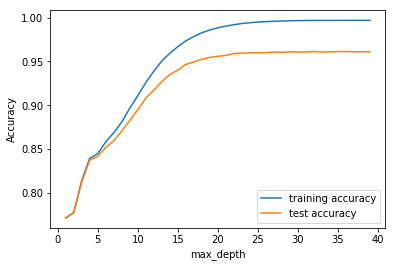

In [390]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### Tuning min_samples_leaf

In [391]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
tree.fit(X_train_dt, y_train_dt)

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'min_samples_leaf': range(5, 200, 20)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [392]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.081230,0.006262,0.003125,0.006250,5,{'min_samples_leaf': 5},0.928627,0.926925,0.925361,0.928748,0.925352,0.927003,0.001491,1,0.962386,0.963202,0.962811,0.963104,0.961347,0.962570,0.000674
1,0.068733,0.007654,0.003125,0.006250,25,{'min_samples_leaf': 25},0.872884,0.882506,0.880813,0.879901,0.880537,0.879328,0.003336,2,0.897743,0.899017,0.897681,0.897258,0.898075,0.897955,0.000591
2,0.065609,0.006249,0.003124,0.006249,45,{'min_samples_leaf': 45},0.870669,0.875863,0.865051,0.869350,0.864643,0.869116,0.004111,3,0.881884,0.882050,0.878631,0.880357,0.881533,0.880891,0.001275
3,0.062484,0.000018,0.003125,0.006250,65,{'min_samples_leaf': 65},0.856343,0.869480,0.859060,0.861925,0.856045,0.860571,0.004937,4,0.871039,0.870197,0.870294,0.870262,0.870982,0.870555,0.000374
4,0.059366,0.006252,0.003125,0.006249,85,{'min_samples_leaf': 85},0.853477,0.867136,0.859320,0.860623,0.858520,0.859815,0.004389,5,0.867652,0.867266,0.865507,0.867722,0.867596,0.867149,0.000835


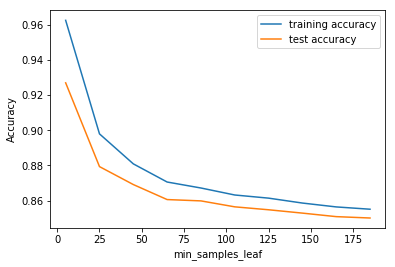

In [393]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### Tuning min_samples_split

In [394]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
tree.fit(X_train_dt, y_train_dt)

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'min_samples_split': range(5, 200, 20)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [395]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.081225,0.006252,0.00313,0.00626,5,{'min_samples_split': 5},0.960406,0.958968,0.955582,0.959880,0.958442,0.958656,0.001683,1,0.995669,0.995311,0.995669,0.995604,0.995441,0.995539,0.000141
1,0.081237,0.006262,0.00000,0.00000,25,{'min_samples_split': 25},0.927455,0.926664,0.921584,0.926925,0.921183,0.924762,0.002773,2,0.957339,0.955842,0.955321,0.957763,0.954736,0.956200,0.001165
2,0.074975,0.006245,0.00313,0.00626,45,{'min_samples_split': 45},0.907788,0.908298,0.902045,0.909079,0.902553,0.905953,0.003015,3,0.934543,0.929334,0.932428,0.934024,0.931812,0.932428,0.001842
3,0.074981,0.006250,0.00000,0.00000,65,{'min_samples_split': 65},0.892811,0.896965,0.889801,0.894099,0.890568,0.892849,0.002569,4,0.919921,0.915234,0.917481,0.915657,0.916376,0.916934,0.001676
4,0.074982,0.006236,0.00000,0.00000,85,{'min_samples_split': 85},0.879396,0.891755,0.879640,0.889670,0.882621,0.884616,0.005148,5,0.908295,0.907711,0.906669,0.907581,0.905858,0.907223,0.000858


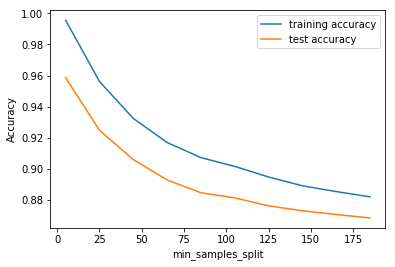

In [396]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

### Grid Search to Find Optimal Hyperparameters for DT

In [296]:
# Creating the parameter grid 
param_grid = {
    'max_depth': range(5, 20, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(25, 100, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train_dt, y_train_dt)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:   10.8s finished


GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': range(5, 20, 5), 'min_samples_leaf': range(50, 150, 50), 'min_samples_split': range(25, 100, 50), 'criterion': ['entropy', 'gini']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [297]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results.head()

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,0.068034,0.001999,0.837645,0.840068,entropy,5,50,25,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",23,0.835244,0.842511,0.847206,0.841279,0.835483,0.838674,0.838088,0.838511,0.832204,0.839363,0.002680,5.436780e-07,0.005131,0.001569
1,0.061421,0.001599,0.837645,0.840068,entropy,5,50,75,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",23,0.835244,0.842511,0.847206,0.841279,0.835483,0.838674,0.838088,0.838511,0.832204,0.839363,0.004935,7.995367e-04,0.005131,0.001569
2,0.062174,0.004524,0.838114,0.839631,entropy,5,100,25,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",21,0.835634,0.842284,0.847076,0.840302,0.835743,0.838641,0.838348,0.838023,0.833768,0.838907,0.006371,5.564004e-03,0.004712,0.001522
3,0.068438,0.001599,0.838114,0.839631,entropy,5,100,75,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",21,0.835634,0.842284,0.847076,0.840302,0.835743,0.838641,0.838348,0.838023,0.833768,0.838907,0.006416,7.993938e-04,0.004712,0.001522
4,0.108284,0.004340,0.868178,0.876638,entropy,10,50,25,"{'criterion': 'entropy', 'max_depth': 10, 'min...",3,0.865590,0.876152,0.871043,0.875993,0.868829,0.878045,0.871564,0.875374,0.863861,0.877625,0.009930,5.732972e-03,0.003014,0.001020


In [298]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

best accuracy 0.8708610134166992
DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=15,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=25,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


<hr>

### Running the model with best parameters obtained from grid search for DT

In [299]:
# model with optimal hyperparameters
clf_gini = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=15, 
                                  min_samples_leaf=50,
                                  min_samples_split=25)

clf_gini.fit(X_train_dt, y_train_dt)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=15,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=25,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

In [300]:
# accuracy score
clf_gini.score(X_test_dt,y_test_dt)

0.8768463923165765

In [301]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_gini, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
               feature_names=features)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

As can be seen in above image, the tree looks too complex. Trying to reduce the max depth to 5 and check the output.

In [302]:
# model with optimal hyperparameters
clf_gini = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=5, 
                                  min_samples_leaf=50,
                                  min_samples_split=25)

clf_gini.fit(X_train_dt, y_train_dt)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=25,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

In [303]:
clf_gini.score(X_test_dt,y_test_dt)

0.8411646708406784

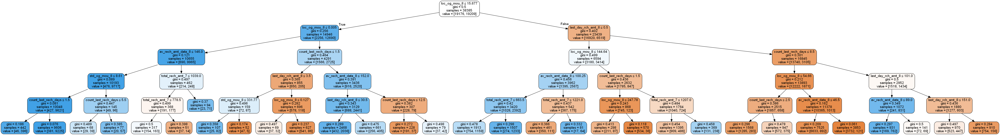

In [304]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_gini, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
               feature_names=features)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

Trying the max depth with 3 and checking the output

In [305]:
# model with optimal hyperparameters
clf_gini = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=3, 
                                  min_samples_leaf=50,
                                  min_samples_split=25)

clf_gini.fit(X_train_dt, y_train_dt)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=25,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

In [306]:
clf_gini.score(X_test_dt,y_test_dt)

0.8123518327153365

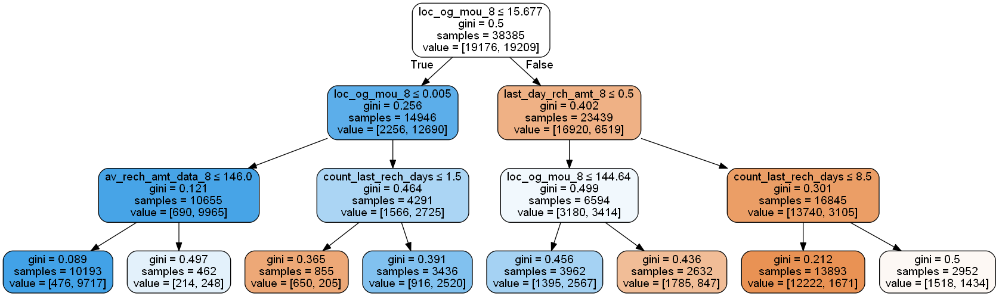

In [307]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_gini, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
               feature_names=features)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

With Max depth at 3, we still have Gini index above .8.

# SVM

In [402]:
#using the train and test data derived after RFE & VIF

X_train_svm = X_train2
X_test_svm = X_test2
y_train_svm = y_train
y_test_svm = y_test

In [403]:
X_train_svm.shape

(38385, 7)

In [404]:
X_test_svm.shape

(16451, 7)

In [405]:
from sklearn.svm import SVC

SVM Model Building... 
First we will build 2 model i.e. Linear & Non-Linear based on the default Hyperparameters and then compare the Accuracy

In [406]:
# linear model

model_linear_svc = SVC(kernel='linear')
model_linear_svc.fit(X_train_svm, y_train_svm)



SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [407]:
# predict
y_pred_svm = model_linear_svc.predict(X_test_svm)

In [408]:
# confusion matrix and accuracy

# accuracy
print("accuracy:", metrics.accuracy_score(y_true=y_test_svm, y_pred=y_pred_svm), "\n")

# cm
print(metrics.confusion_matrix(y_true=y_test_svm, y_pred=y_pred_svm))

accuracy: 0.8342957874901222 

[[6864 1378]
 [1348 6861]]


In [409]:
# non-linear model
# using rbf kernel, C=1, default value of gamma

# model
non_linear_model_svm = SVC(kernel='rbf')

# fit
non_linear_model_svm.fit(X_train_svm, y_train_svm)

# predict
y_pred_svm = non_linear_model_svm.predict(X_test_svm)

In [410]:
# confusion matrix and accuracy

# accuracy
print("accuracy:", metrics.accuracy_score(y_true=y_test_svm, y_pred=y_pred_svm), "\n")

# cm
print(metrics.confusion_matrix(y_true=y_test_svm, y_pred=y_pred_svm))

accuracy: 0.8556926630599964 

[[7088 1154]
 [1220 6989]]


The non-linear model gives approx. 86% accuracy. So, we choose hyperparameters corresponding to non-linear models.

Grid Search: Hyperparameter Tuning

In [411]:
# creating a KFold object with 5 splits 
folds = KFold(n_splits = 5, shuffle = True, random_state = 101)

# specify range of hyperparameters
# Set the parameters by cross-validation
hyper_params = [ {'gamma': [1e-2, 1e-3, 1e-4],
                     'C': [1, 10, 100, 1000]}]


# specify model
model_svc = SVC(kernel="rbf")

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = model_svc, 
                        param_grid = hyper_params, 
                        scoring= 'accuracy', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_train_svm, y_train_svm)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed: 25.3min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=101, shuffle=True),
       error_score='raise',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid=[{'gamma': [0.01, 0.001, 0.0001], 'C': [1, 10, 100, 1000]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='accuracy', verbose=1)

In [412]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,11.826985,0.127617,1.521515,0.025383,1,0.01,"{'C': 1, 'gamma': 0.01}",0.836785,0.842386,0.831445,0.839781,0.847466,0.839573,0.005369,4,0.840921,0.840498,0.841279,0.839814,0.838283,0.840159,0.001057
1,13.655506,0.211167,1.765069,0.048460,1,0.001,"{'C': 1, 'gamma': 0.001}",0.829360,0.836264,0.821545,0.832747,0.840563,0.832096,0.006454,10,0.833366,0.831803,0.834668,0.831673,0.830598,0.832422,0.001429
2,16.690364,0.220943,2.349756,0.068061,1,0.0001,"{'C': 1, 'gamma': 0.0001}",0.822457,0.828058,0.810994,0.827667,0.832617,0.824358,0.007417,12,0.824508,0.824215,0.826397,0.824508,0.821349,0.824196,0.001621
3,11.879792,0.182165,1.449659,0.049794,10,0.01,"{'C': 10, 'gamma': 0.01}",0.840953,0.844340,0.835092,0.840953,0.849551,0.842178,0.004738,3,0.844177,0.841898,0.844764,0.842191,0.840205,0.842647,0.001647
4,12.612331,0.162816,1.632189,0.056294,10,0.001,"{'C': 10, 'gamma': 0.001}",0.830793,0.839130,0.829751,0.836264,0.843689,0.835925,0.005198,7,0.837404,0.835450,0.838413,0.835157,0.833854,0.836056,0.001637
5,13.728353,0.134351,1.757139,0.051969,10,0.0001,"{'C': 10, 'gamma': 0.0001}",0.828709,0.835483,0.821415,0.834050,0.839521,0.831835,0.006255,11,0.832715,0.831314,0.833854,0.831673,0.830012,0.831914,0.001299
6,16.471572,0.315031,1.368428,0.015931,100,0.01,"{'C': 100, 'gamma': 0.01}",0.843038,0.848769,0.840563,0.844992,0.853719,0.846216,0.004612,2,0.846978,0.846359,0.848639,0.846490,0.844601,0.846613,0.001294
7,12.608683,0.270496,1.493708,0.016070,100,0.001,"{'C': 100, 'gamma': 0.001}",0.837176,0.841996,0.831575,0.838869,0.847466,0.839416,0.005259,5,0.840888,0.839521,0.841605,0.839162,0.837534,0.839742,0.001417
8,13.387930,0.117610,1.612121,0.011691,100,0.0001,"{'C': 100, 'gamma': 0.0001}",0.830663,0.835613,0.823108,0.834831,0.841475,0.833138,0.006086,9,0.834343,0.832877,0.835385,0.833138,0.831021,0.833353,0.001471
9,52.429887,0.965801,1.346558,0.038773,1000,0.01,"{'C': 1000, 'gamma': 0.01}",0.844861,0.852026,0.842126,0.847597,0.857236,0.848769,0.005349,1,0.850397,0.848997,0.851049,0.850397,0.847955,0.849759,0.001124


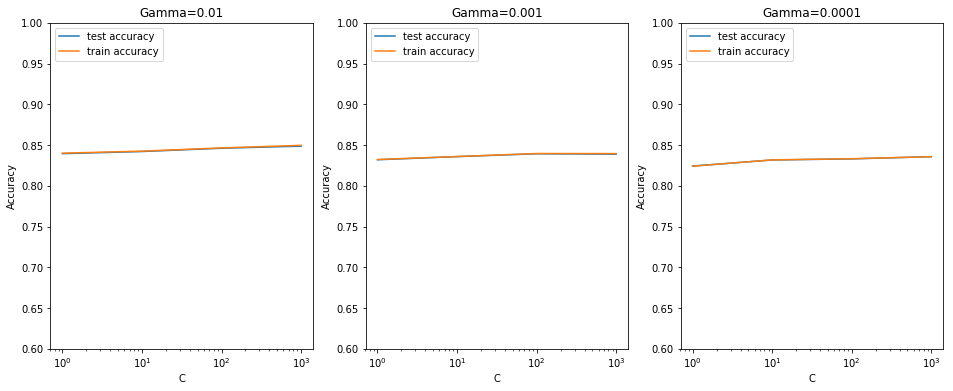

In [413]:
# converting C to numeric type for plotting on x-axis
cv_results['param_C'] = cv_results['param_C'].astype('int')

# # plotting
plt.figure(figsize=(16,6))

# subplot 1/3
plt.subplot(131)
gamma_01 = cv_results[cv_results['param_gamma']==0.01]

plt.plot(gamma_01["param_C"], gamma_01["mean_test_score"])
plt.plot(gamma_01["param_C"], gamma_01["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.01")
plt.ylim([0.60, 1])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

# subplot 2/3
plt.subplot(132)
gamma_001 = cv_results[cv_results['param_gamma']==0.001]

plt.plot(gamma_001["param_C"], gamma_001["mean_test_score"])
plt.plot(gamma_001["param_C"], gamma_001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.001")
plt.ylim([0.60, 1])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')


# subplot 3/3
plt.subplot(133)
gamma_0001 = cv_results[cv_results['param_gamma']==0.0001]

plt.plot(gamma_0001["param_C"], gamma_0001["mean_test_score"])
plt.plot(gamma_0001["param_C"], gamma_0001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.0001")
plt.ylim([0.60, 1])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')



In [414]:
# printing the optimal accuracy score and hyperparameters
best_score = model_cv.best_score_
best_hyperparams = model_cv.best_params_

print("The best test score is {0} corresponding to hyperparameters {1}".format(best_score, best_hyperparams))

The best test score is 0.8487690504103166 corresponding to hyperparameters {'C': 1000, 'gamma': 0.01}


In [415]:
# model with optimal hyperparameters

# model
model = SVC(C=1000, gamma=0.01, kernel="rbf")

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# metrics
print("accuracy", metrics.accuracy_score(y_test, y_pred), "\n")
print(metrics.confusion_matrix(y_test, y_pred), "\n")

accuracy 0.9717950276578932 

[[7783  459]
 [   5 8204]] 



We have come down from 200+ no of columns to 7 columns with Features selection process. Also, we have trained multiple models and after going throuh the these, We come to the conclusion as below:

- **For Churn Prediction** - We choose the **Random Forest with PCA** model as it provides higher Accuracy(86%) and Sensitivity(84%) over the model using Logistic Regression with PCA.
- **For Strategy recommendation** - We decided to go with the **Decision Tree** model. Final Decision Tree model can give us a clear picture about the actions recommendations. 

**Observations from the Final Decision Tree model** are as below -
1. Customers who have made Local Outgoing calls in Auguest very less, have a tendency to Churn more. 
2. Customers whose last recharge date was less than 8 or 9 days, have lesser tendency to Churn.
3. Subscribers who have average recharge amount of data pack on the month of Auguest less than 146, tend to Churn more. 

**Recommendations for Business**

Based on the above observations, below are some actions that can be considered by the company for the customers who may Churn -
1. Proactively communicating with customers to address the difficulties and issues faced by them. This will not only help in build trust and reliebility, but also ensure a strong relationship.
2. These customers can be communicated with the new service offerings based on the usage analysis & trends. Also, they should be proactively provided information on the plans which will benefit the customer.
3. After Sales services is a key to retain the customers. The Company should provide priviledge support to high value customers . This will improve customer satisfaction as the users will experience a special priviledge. 